In [1]:
import numpy as np
import pandas as pd
import os
from pathlib import Path
import time
import glob
import re
import gc

import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from dask.distributed import Client
from IPython.display import IFrame

from tqdm.notebook import tqdm

from skimage.transform import ProjectiveTransform, AffineTransform, EuclideanTransform, warp
from sklearn.linear_model import (LinearRegression,
                                  TheilSenRegressor,
                                  RANSACRegressor,
                                  HuberRegressor,
                                  RidgeCV,
                                  LassoCV)
import mrcfile
try:
    import skimage.external.tifffile as tiff
except:
    import tifffile as tiff

from SIFT_gs.FIBSEM_SIFT_gs import FIBSEM_frame, FIBSEM_dataset
from SIFT_gs.FIBSEM_SIFT_gs import get_min_max_thresholds
from SIFT_gs.FIBSEM_SIFT_gs import (ShiftTransform,
                                    XScaleShiftTransform,
                                    ScaleShiftTransform,
                                    RegularizedAffineTransform)
            
from SIFT_gs.FIBSEM_SIFT_gs import (generate_report_mill_rate_xlsx,
                                    generate_report_FOV_center_shift_xlsx,
                                    generate_report_data_minmax_xlsx,
                                    generate_report_ScanRate_EHT_xlsx,
                                    generate_report_transf_matrix_from_xlsx,
                                    generate_report_from_xls_registration_summary,
                                    plot_registrtion_quality_xlsx,
                                    read_kwargs_xlsx)
                       
from SIFT_gs.FIBSEM_SIFT_gs import plot_cross_sections_mrc_stack, add_scale_bar
from SIFT_gs.FIBSEM_SIFT_gs import (bin_crop_mrc_stack,
                                    show_eval_box_mrc_stack,
                                   analyze_mrc_stack_registration)
from SIFT_gs.FIBSEM_SIFT_gs import plot_2D_blob_results, plot_2D_blob_examples
from SIFT_gs.FIBSEM_SIFT_gs import build_kernel_FFT_zero_destreaker_XY, build_kernel_FFT_zero_destreaker_radii_angles
from SIFT_gs.FIBSEM_SIFT_gs import (destreak_mrc_stack_with_kernel,
                                    destreak_single_frame_kernel_shared,
                                    smooth_mrc_stack_with_kernel)

skimage version:  0.22.0
scipy version:    1.11.4
sklearn version:  1.5.0
Open CV version:  4.10.0
SIFT_gs version:  4.0.1


In [2]:
import skimage
print(skimage.__version__)

import sklearn
print(sklearn.__version__)

0.22.0
1.5.0


# Set up Local DASK Client and Monitor Window

In [3]:
#start / restart client
try:
    client.restart()
except:
    client = Client()
    
# setup a window to monitor the client progress
try:
    dport = client.scheduler_info()['services']['dashboard']
except:
    dport = client.scheduler_info()['services']['bokeh']
print('Using Local Port:   ', dport)
status_update_address0 = 'http://localhost:{:d}/status'.format(dport)
print('Use ' + status_update_address0 +' to monitor DASK progress')
status_update_address = 'http://localhost:{:d}/status'.format(dport)
IFrame(src=status_update_address, width='100%', height='900px')

C:\Users\labadmin\anaconda3\Lib\site-packages\distributed\node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 57538 instead
  warnings.warn(


Using Local Port:    57538
Use http://localhost:57538/status to monitor DASK progress


# This is where the data processing begins.

# Step 0a: Set up the Processing Parameters.

In [4]:
data_dir = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw'

ftype = 1 # 0 for Shan's .dat files, 1 for tif files

use_DASK = True
DASK_client_retries = 3  # Number of allowed automatic retries if a task fails

threshold_min = 1e-3    # This are used to determine Min and Max data boundaries for I8 conversion
threshold_max = 1e-3                            
sliding_minmax = True   # If True, Global Min and Max for I8 conversion the entire data set is used. If False, Min and Max are allowed to vary slowly.
nbins = 256             # Number of histogram bins for determining Min and Max above

BFMatcher = False       # If True, the BF Matcher is used for keypont matching
                        # otherwise FLANN Matcher (faster, preferable) is used.

save_matches = True     # If True, matches will be saved into individual files

# Uncomment one from the below choices:
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
if TransformType == RegularizedAffineTransform:
    l2_param = 1e-5                                  # regularization strength (shrinkage parameter)
    l2_matrix = np.eye(6)*l2_param                   # initially set equal shrinkage on all coefficients
    l2_matrix[2,2]=0                                 # turn OFF the regularization on shifts
    l2_matrix[5,5]=0                                 # turn OFF the regularization on shifts
    targ_vector = np.array([1, 0, 0, 0, 1, 0])       # target transformation is shift only: Sxx=Syy=1, Sxy=Syx=0
    suffix = 'l2_{:.0e}'.format(l2_matrix[0,0])
else:
    l2_matrix= None
    targ_vector = None
    suffix = 'bilin'                  # optonal characters that will be added to the end of the filename (before the extension)

SIFT_nfeatures = 0     # SIFT libary default is 0. The number of best features to retain.
                                # The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    
SIFT_nOctaveLayers = 3          # SIFT libary default  is 3. The number of layers in each octave.
                                # 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.

SIFT_contrastThreshold = 0.040   # SIFT libary default  is 0.04. The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions.
                                # The larger the threshold, the less features are produced by the detector.
                                # The contrast threshold will be divided by nOctaveLayers when the filtering is applied.
                                # When nOctaveLayers is set to default and if you want to use the value used in
                                # D. Lowe paper (0.03), set this argument to 0.09.
                                
SIFT_edgeThreshold = 10         # SIFT libary default  is 10. The threshold used to filter out edge-like features.
                                # Note that the its meaning is different from the contrastThreshold,
                                # i.e. the larger the edgeThreshold, the less features are filtered out
                                # (more features are retained).

SIFT_sigma = 1.6                # SIFT library default is 1.6. 	The sigma of the Gaussian applied to the input image at the octave #0.
                                # If your image is captured with a weak camera with soft lenses, you might want to reduce the number.
    
Lowe_Ratio_Threshold = 0.7
    
solver = 'RANSAC'       # String indicating which solver is to be used.'RANSAC' will use RANSAC (Random Sample Consensus) algorithm.
                        # 'LinReg' will use Linear Regression with iterative "Throwing out the Worst Residual" Heuristic
RANSAC_initial_fraction = 0.001  # fraction of data points for initial RANSAC iteration step.

drmax = 1.5              # dimensions - pixels.
                         #  - in the case of 'RANSAC' - Maximum distance for a data point to be classified as an inlier.
                         #  - in the case of 'LinReg' - outlier threshold for iterative regression:
                         # For each matched pair of keypoins the error is calculated as err[j] = dst_pts[j] - A*src_pts[j]
                         # The iterative procedure throws away the matched keypoint pair with worst error on every iteration
                         # until the worst error falls below drmax or the max number of iterations is reached.

max_iter = 1000     # max number of iterations in the iterative procedure above

save_data_as_tiff = False    # Convert and Save the InLens.tif data

save_res_png = True        # Save PNG images of the intemediate processing statistics and final registration quality check.

dtp = np.int16                  # Python data type for saving. Deafult is int16, the other option currently is uint8.

preserve_scales = True       # If True, the transformation matrix will be adjusted using the settings defined by fit_params below
fit_params = ['SG', 501, 3]  # perform the above adjustment using  Savitzky-Golay (SG) filter with parameters
                             # window size 701, polynomial order 3
#fit_params = ['LF']         # another option is to use linear fit with forces start points Sxx and Syy = 1 and Sxy and Syx = 0
#fit_params = ['PF', 2]      # another option is to use polynomial fit (in this case of order 2)

subtract_linear_fit = [True, True]  # If True, the linear slopes along X- and Y- directions (respectively) will be subtracted from the cumulative shifts.
                                    # This is performed after the optimal frame-to-frame shifts are recalculated for preserve_scales = True 
subtract_FOVtrend_from_fit = [True, True]  # If True, FOV trends (image shifts performed during imaging) will be subtracted first, so they do not bias the linear trends.
    
pad_edges = True             # If True, the edges will be padded with the amount equal to max shift excursion in each direction

flipY = True                 # If True, the dataset will be flipped along Y-direction

zbin_factor =  1             # binning factor in z-direction (milling direction). Data will be binned when saving the final result. Default is 1.

eval_metrics = ['NSAD', 'NCC', 'NMI', 'FSC']   # list of metrics used for evaluation of registration (and resolution).
                                        # Options are; 'NSAD', 'NCC', 'NMI', 'FSC'
fnm_types = ['h5', 'mrc']    #   File type(s) for output data. Options are: ['h5', 'mrc'].
                             # Defauls is ['mrc']. 
                             # 'h5' is BigDataViewer HDF5 format, uses npy2bdv package. Use empty list if do not want to save the data.

int_order = 1                #     The order of interpolation. The order has to be in the range 0-5:
                             #    - 0: Nearest-neighbor
                             #    - 1: Bi-linear (default)
                             #    - 2: Bi-quadratic
                             #    - 3: Bi-cubic
                             #    - 4: Bi-quartic
                             #    - 5: Bi-quintic
#suffix = suffix + '_r2'
#********************************************************************************************************
# DO NOT MODIFY THE CODE BELOW!
#********************************************************************************************************

if ftype == 0:
    fls = sorted(glob.glob(os.path.join(data_dir,'*.dat')))
    if len(fls) == 0 :
        fls = sorted(glob.glob(os.path.join(data_dir,'*/*.dat')))
if ftype == 1:
    fls = sorted(glob.glob(os.path.join(data_dir,'slice*.tif')))
    if len(fls) == 0 :
        fls = sorted(glob.glob(os.path.join(data_dir,'*/slice*.tif')))
nfrs = len(fls)

if fit_params[1] > nfrs//2*2-1:  # if smoothing aperture (Sov-Gol) is larger than number of frames, reduce the aperture
    fit_params[1] = nfrs//2*2-1

fnm0 = (os.path.join(data_dir,fls[0]))
frame0 = FIBSEM_frame(fnm0, ftype=ftype)
Sample_ID = frame0.Sample_ID.strip('\x00')
EightBit = frame0.EightBit
Sample_ID = 'AMST dataset'

SIFT_kwargs = {
    'ftype' : ftype,
    'data_dir' : data_dir,
    'Sample_ID' : Sample_ID,
    'EightBit' : EightBit,
    'use_DASK' : use_DASK,
    'DASK_client_retries' : DASK_client_retries,
    'threshold_min' : threshold_min, 
    'threshold_max' : threshold_max,
    'sliding_minmax' : sliding_minmax,
    'nbins' : nbins,
    'TransformType' : TransformType,
    'SIFT_nfeatures' : SIFT_nfeatures,
    'SIFT_nOctaveLayers' : SIFT_nOctaveLayers,
    'SIFT_contrastThreshold' : SIFT_contrastThreshold,
    'SIFT_edgeThreshold' : SIFT_edgeThreshold,
    'SIFT_sigma' : SIFT_sigma,
    'Lowe_Ratio_Threshold' : Lowe_Ratio_Threshold,
    'l2_matrix' : l2_matrix,
    'targ_vector': targ_vector, 
    'solver' : solver,
    'RANSAC_initial_fraction' : RANSAC_initial_fraction,
    'drmax' : drmax,
    'max_iter' : max_iter,
    'BFMatcher' : BFMatcher,
    'save_matches' : save_matches,
    'save_res_png' : save_res_png,
    'save_data_as_tiff' : save_data_as_tiff,
    'dtp' : dtp,
    'preserve_scales' : preserve_scales,
    'fit_params' : fit_params,
    'subtract_linear_fit' : subtract_linear_fit,
    'subtract_FOVtrend_from_fit' : subtract_FOVtrend_from_fit,
    'pad_edges' : pad_edges,
    'zbin_factor' : zbin_factor,
    'eval_metrics' : eval_metrics,
    'fnm_types' : fnm_types,
    'flipY' : flipY,
    'int_order' : int_order,
    'suffix' : suffix}

test_dataset = FIBSEM_dataset(fls, fnm_reg = 'Registered_RegAffine.mrc', **SIFT_kwargs)

2024/06/24  11:21:02   Registered data will be saved into:  Registered_RegAffine.mrc
Total Number of frames:  1727


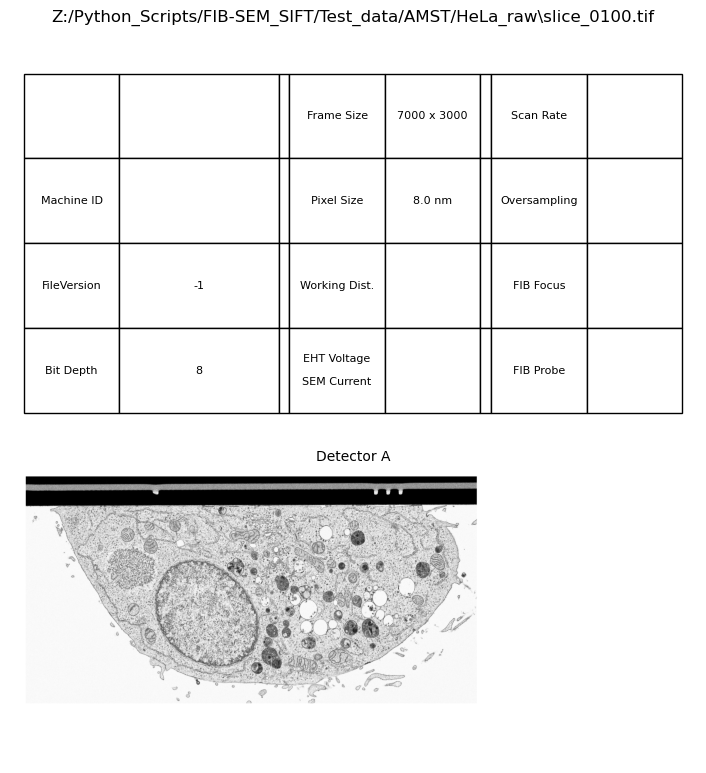

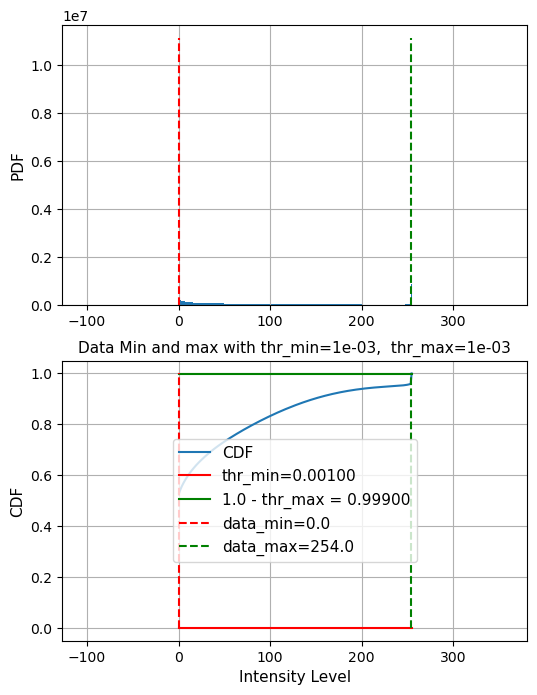

In [5]:
fr_inds = [100]
for fr_ind in fr_inds:
    test_frame = FIBSEM_frame(fls[fr_ind])
    test_frame_suff = Path(fls[fr_ind]).suffix
    snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_snapshot.png'))
    test_frame.save_snapshot(snapshot_name=snapshot_name)
    get_min_max_thresholds(test_frame.RawImageA, disp_res=True)

In [6]:
test_frame.header

{'NewSubfileType': <FILETYPE.UNDEFINED: 0>,
 'ImageWidth': 7000,
 'ImageLength': 3000,
 'BitsPerSample': 8,
 'PhotometricInterpretation': <PHOTOMETRIC.MINISBLACK: 1>,
 'ImageDescription': 'ImageJ=1.52d',
 'StripOffsets': (148,),
 'SamplesPerPixel': 1,
 'RowsPerStrip': 3000,
 'StripByteCounts': (21000000,)}

# Step 0b: Check the settings: Perform SIFT alignemebts ontwo frames in the middle of the stack

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0863.tif , extracted 137992 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0864.tif , extracted 138393 keypoints
# of detected matches: 1204
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0010, max_iter=1000
# of keypoints = 137992, # of matches =1204
2024/06/24  11:21:41   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 1.00009425e+00  3.82053466e-04 -8.69699892e-01]
 [ 1.36111228e-05  1.00025100e+00 -3.86887573e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
1204 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1184
CPU times: total: 1min 3s
Wall time: 32.3 s


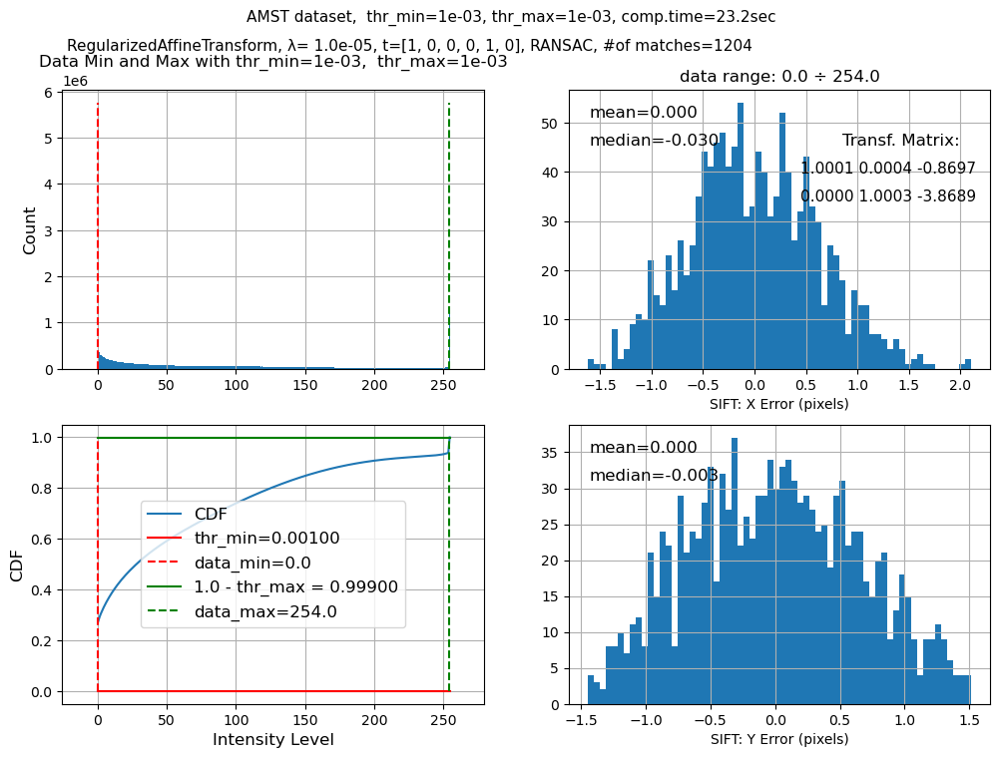

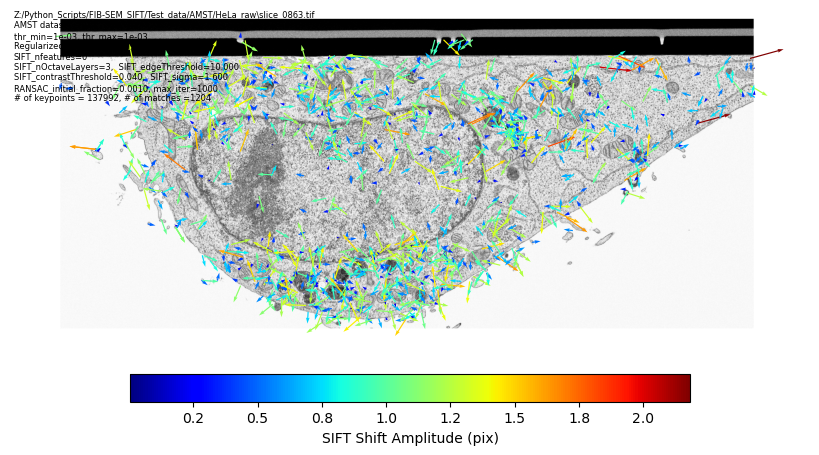

In [7]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation()

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0863.tif , extracted 137992 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0864.tif , extracted 138393 keypoints
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0010, max_iter=1000
# of keypoints = 137992, # of matches =1223
2024/06/22  09:57:00   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 9.99933271e-01  2.68539908e-04 -1.61100460e-01]
 [-6.69345188e-05  1.00015940e+00 -3.57003335e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
1223 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1165
CPU times: total: 1min 7s
Wall time: 34 s


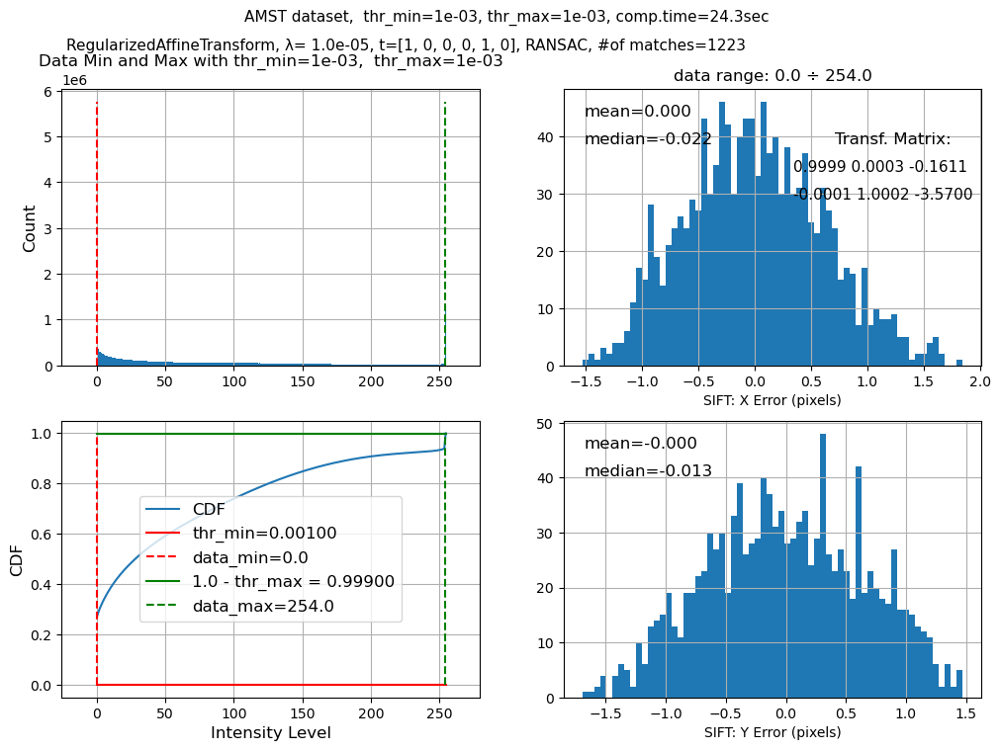

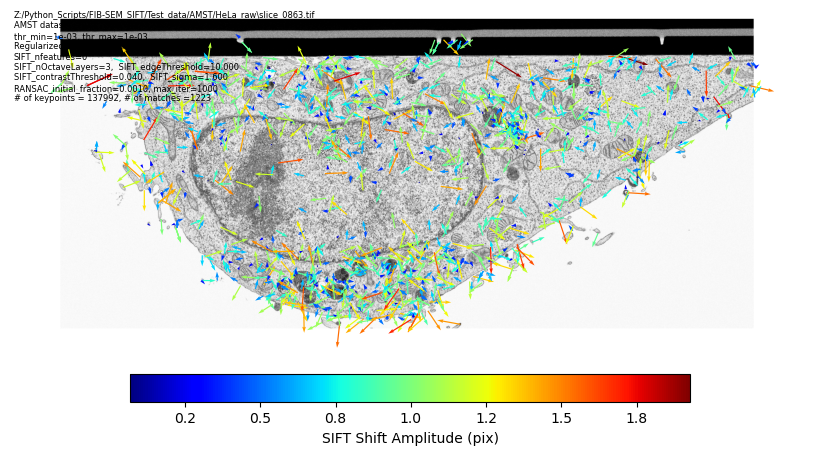

In [6]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation()

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0030.tif , extracted 85777 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0031.tif , extracted 85207 keypoints
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0010, max_iter=1000
# of keypoints = 85777, # of matches =17
2024/06/22  09:57:33   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 9.76438348e-01 -3.94759447e-03  6.24813835e+01]
 [ 7.30352216e-03  9.93347204e-01 -9.34713008e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
17 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1797
CPU times: total: 51.4 s
Wall time: 29.1 s


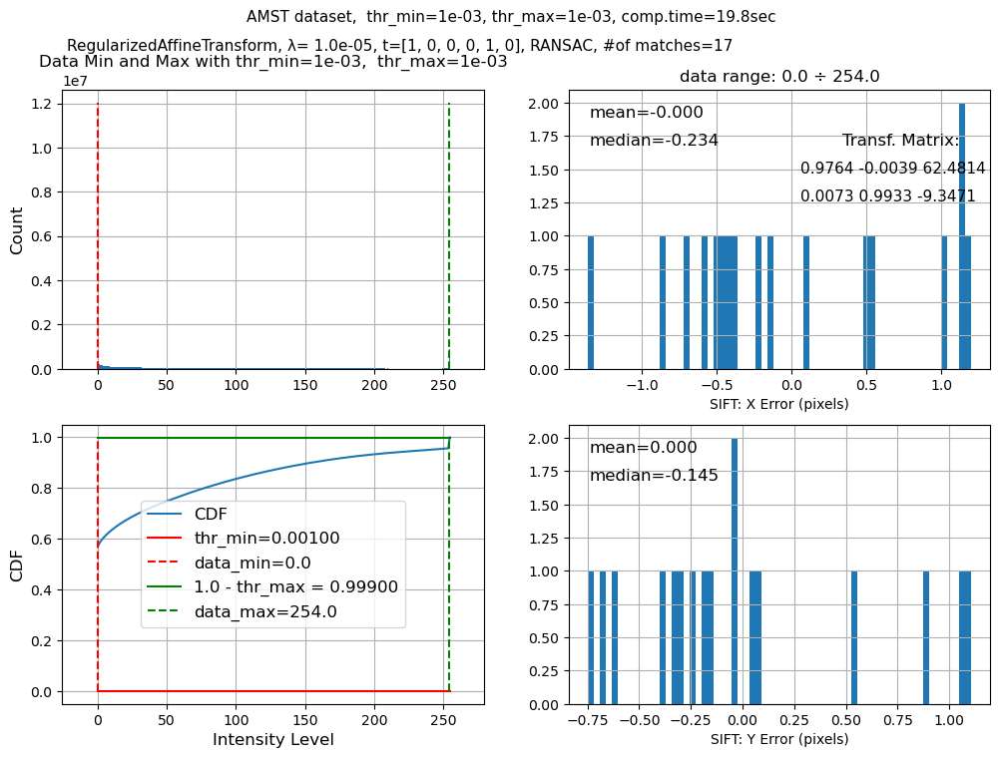

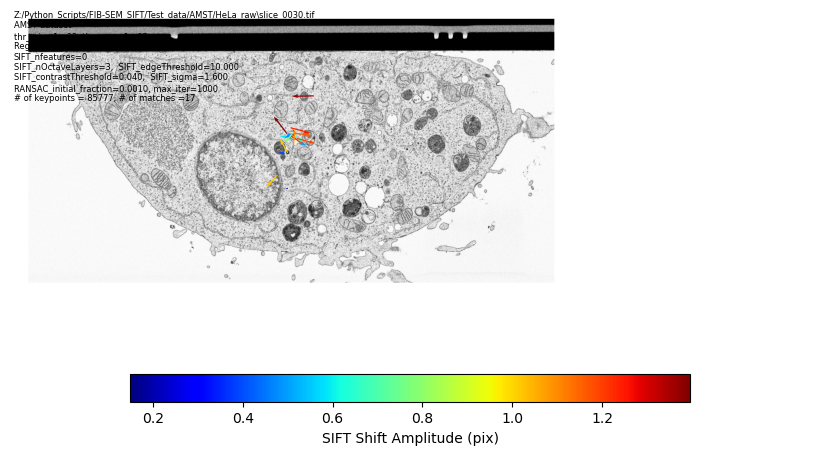

In [7]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[30], fls[31]])

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0030.tif , extracted 85777 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0031.tif , extracted 85207 keypoints
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, LinReg,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0010, max_iter=1000
# of keypoints = 85777, # of matches =1049
2024/06/22  09:59:31   Transformation Matrix determined using RegularizedAffineTransform using LinReg solver
[[ 1.00000719e+00  4.45386462e-05 -4.23287744e-01]
 [-1.23074796e-05  1.00014344e+00  8.34890891e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
1049 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 812
CPU times: total: 49.6 s
Wall time: 26.4 s


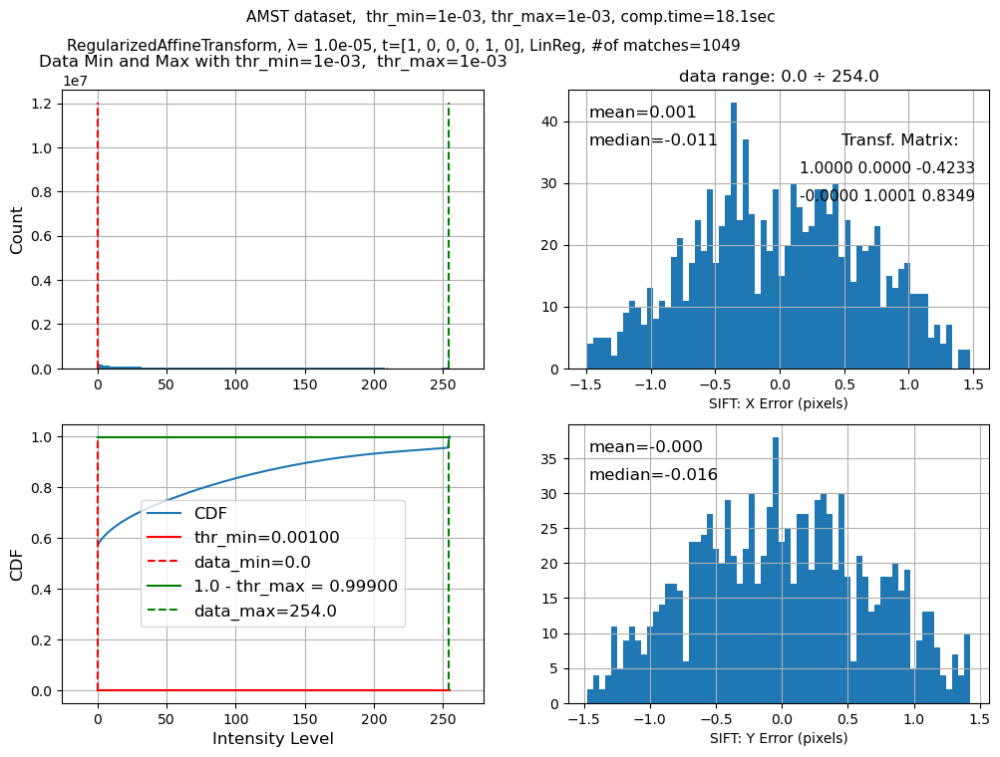

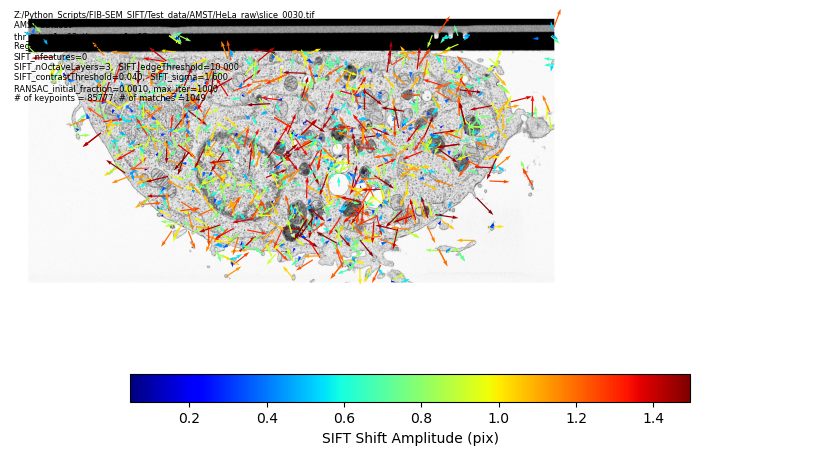

In [8]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[30], fls[31]],
                                                       solver='LinReg')

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0030.tif , extracted 85777 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0031.tif , extracted 85207 keypoints


C:\Users\labadmin\anaconda3\Lib\site-packages\skimage\measure\fit.py:672: RuntimeWarning: divide by zero encountered in scalar divide
  return np.ceil(np.log(nom) / np.log(denom))


# of detected matches: 6
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.5000, max_iter=1000
# of keypoints = 85777, # of matches =6
2024/06/24  11:22:37   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 9.74877333e-01 -4.51227593e-03  6.79916463e+01]
 [ 4.78999811e-03  9.83075387e-01  7.38849922e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
6 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1854
CPU times: total: 46.9 s
Wall time: 23.7 s


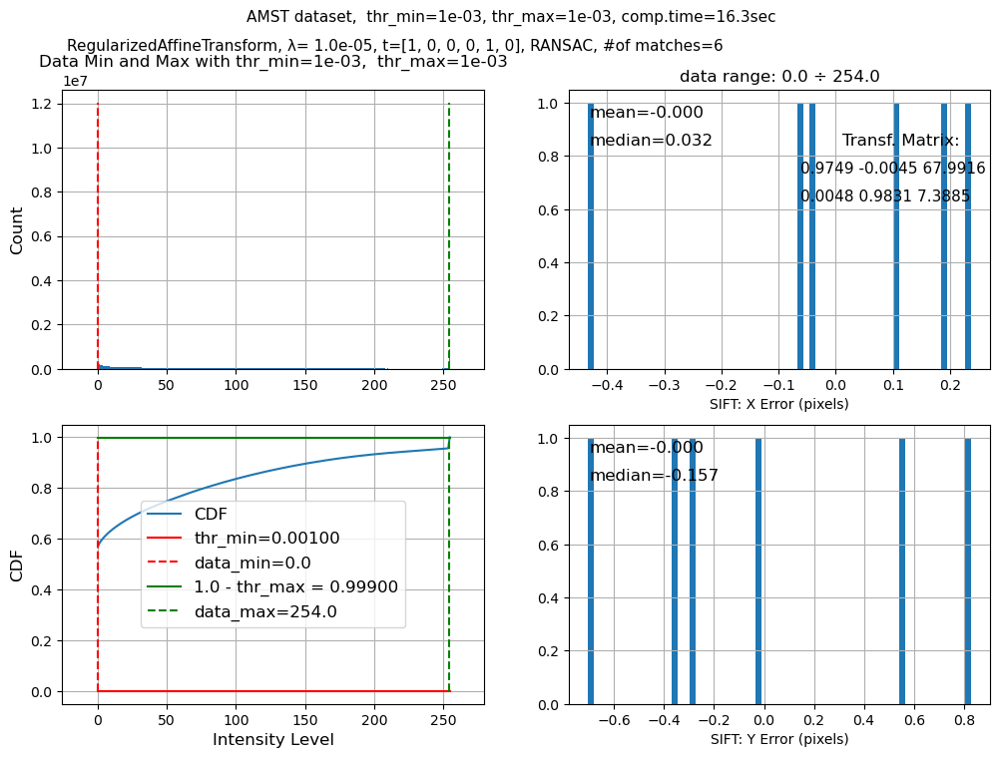

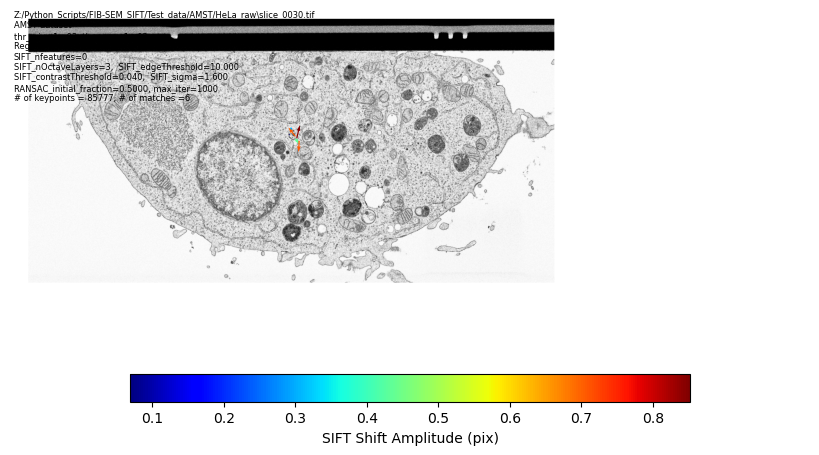

In [9]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[30], fls[31]],
                                                      RANSAC_initial_fraction =0.5)

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0030.tif , extracted 85777 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0031.tif , extracted 85207 keypoints
# of detected matches: 0
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0001, max_iter=1000
# of keypoints = 85777, # of matches =0
2024/06/24  11:22:09   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
0 keypoint matches were detected with 1.5 pixel outlier threshold
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\IPython\core\magics\execution.py", line 1340, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 1, in <module>
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\SIFT_gs\FIBSEM_SIFT_gs.py", line 9601, in SIFT_evaluation
    print('Number of iterations: {:d}'.format(iteration))
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
ValueError: Unknown format code 'd' for object of type 'float'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py", line 2144, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\IPython\core\ultratb.py", line 1435, in structured_traceback
    return FormattedTB.structured_traceback(
         

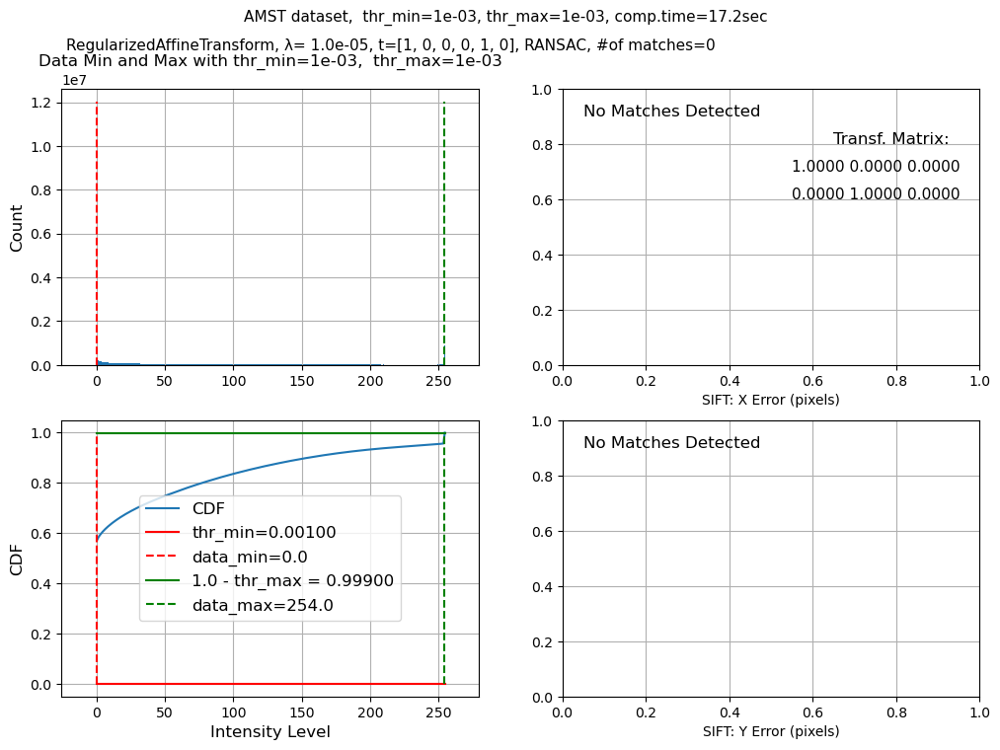

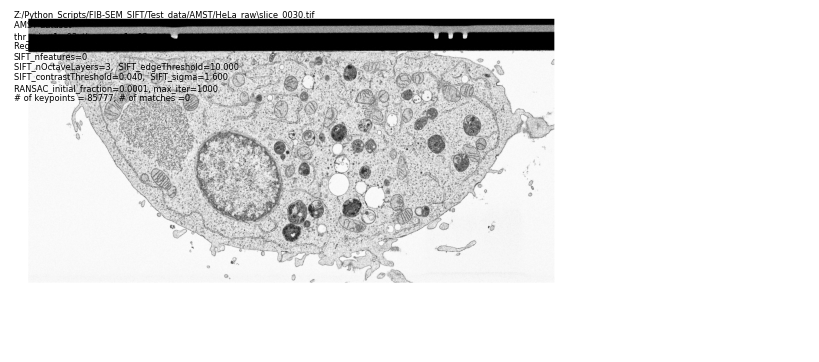

In [8]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[30], fls[31]],
                                                      RANSAC_initial_fraction =0.00005)

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0030.tif , extracted 85777 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0031.tif , extracted 85207 keypoints


C:\Users\labadmin\anaconda3\Lib\site-packages\skimage\measure\fit.py:672: RuntimeWarning: divide by zero encountered in scalar divide
  return np.ceil(np.log(nom) / np.log(denom))
C:\Users\labadmin\anaconda3\Lib\site-packages\matplotlib\axes\_axes.py:6826: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
C:\Users\labadmin\anaconda3\Lib\site-packages\matplotlib\axes\_axes.py:6827: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

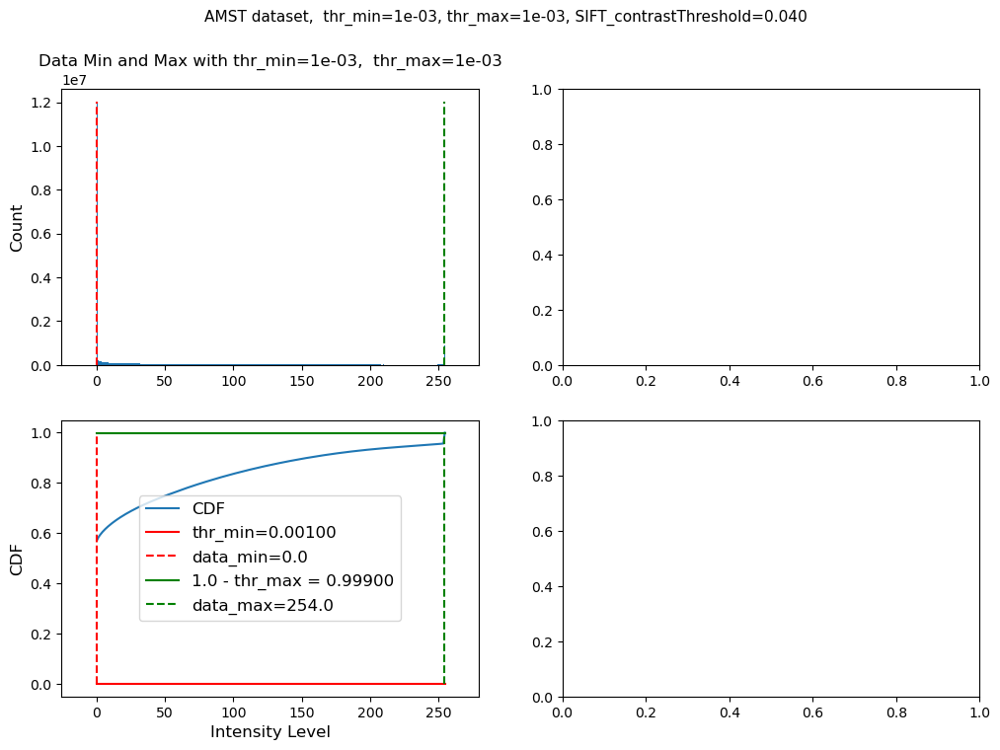

In [9]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[30], fls[31]],
                                                      RANSAC_initial_fraction =0.005)

In [13]:
from skimage.measure import ransac

In [ ]:
ransac(

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0035.tif , extracted 83855 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0036.tif , extracted 83245 keypoints
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.040,  SIFT_sigma=1.600
RANSAC_initial_fraction = 0.0050, max_iter=1000
# of keypoints = 83855, # of matches =757
2024/06/22  06:40:24   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 1.00010345e+00  3.56148653e-04 -2.08335983e+00]
 [ 4.88035732e-05  1.00010418e+00  1.29861916e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
757 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 799
CPU times: total: 53.2 s
Wall time: 29.2 s


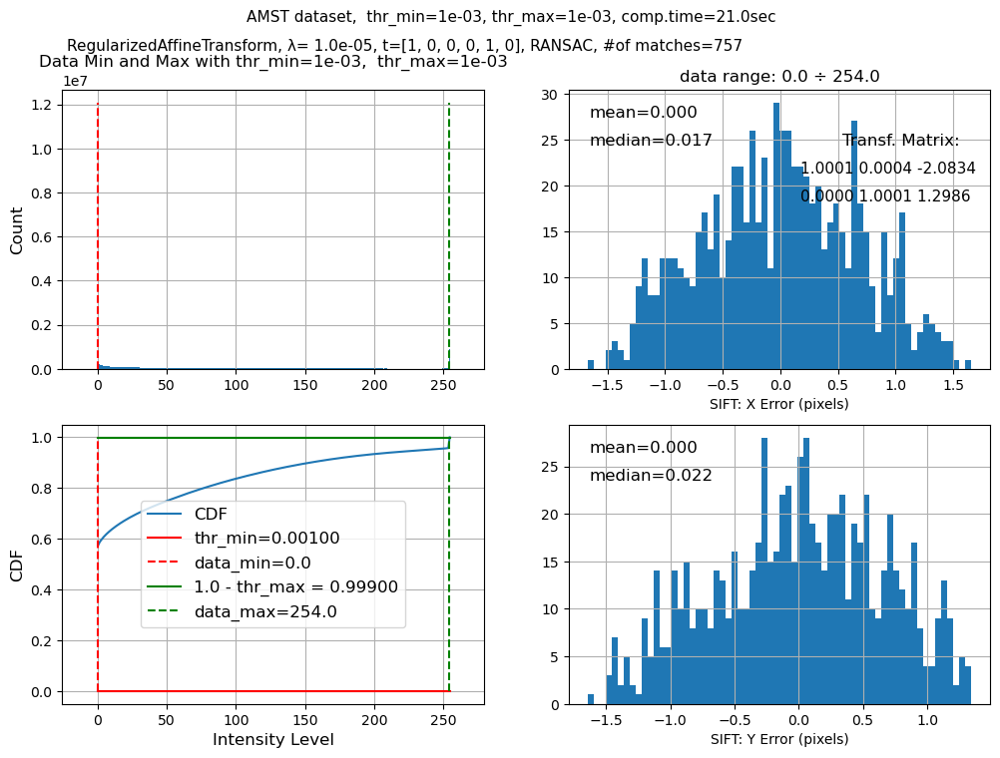

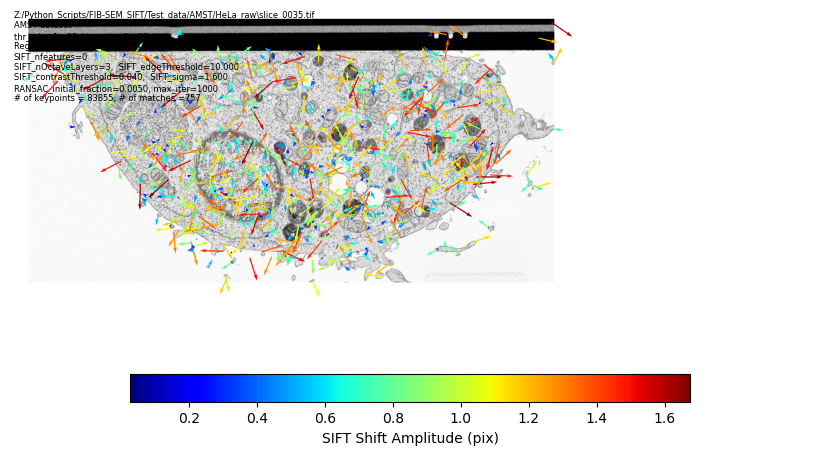

In [19]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[35], fls[36]],
                                                      RANSAC_initial_fraction =0.005)

AMST dataset
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0035.tif , extracted 83855 keypoints
File:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\slice_0036.tif , extracted 83245 keypoints
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\IPython\core\magics\execution.py", line 1340, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 1, in <module>
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\SIFT_gs\FIBSEM_SIFT_gs.py", line 9587, in SIFT_evaluation
    dmin, dmax, comp_time, transform_matrix, n_matches, iteration, kpts = SIFT_evaluation_dataset(eval_fls, **SIFT_evaluation_kwargs)
                                                                          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\labadmin\anaconda3\Lib\site-packages\SIFT_gs\FIBSEM_SIFT_gs.py", line 8120, in SIFT_evaluation_dataset
    src_pts_transformed = src_pts_filtered @ transform_matrix[0:2, 0:2].T + transform_matrix[0:2, 2]
                          ~~~~~~~~~~~~~~~~~^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,

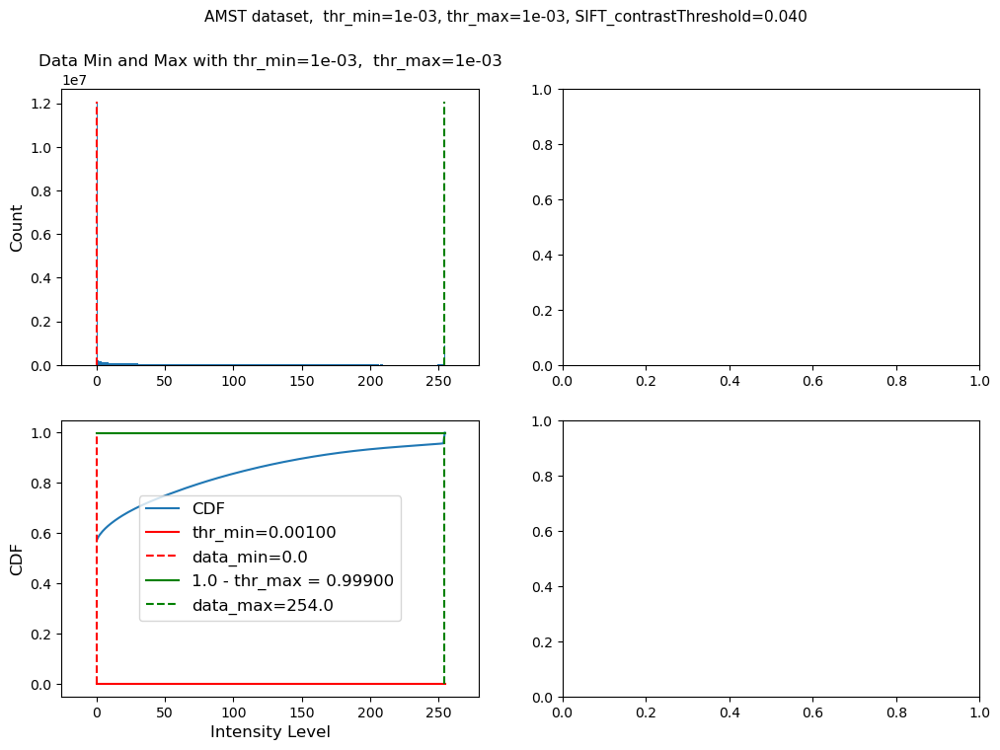

In [20]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation(eval_fls=[fls[35], fls[36]])

# Now Perform SIFT Computations using DASK Distributed (local cluster, using SCATTER, MAP and GATHER)

# Step 2a: Save InLens.tif Data (Optional)

In [7]:
if save_data_as_tiff:
    test_dataset.convert_raw_data_to_tif_files(client)

# Step 2b: Evaluate parameters of FIBSEM data set (Data Min/Max, Working Distance, Milling Y Voltage, FOV center positions)

DASK client exists. Will perform distributed computations
Use http://localhost:53438/status to monitor DASK progress
Evaluating the parameters of FIBSEM data set (data Min/Max, Working Distance, Milling Y Voltage, FOV center positions, Scan Rate, EHT)
Original data is 8-bit, no need to find Min and Max for 8-bit conversion
2024/06/21  22:54:13   Saving the FIBSEM dataset statistics (Min/Max, Mill Rate, FOV Shifts into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\FIBSEM_Data.xlsx
No milling rate data is available, isotropic voxel size is set to 8.00 nm
Using fit_params:  SG 431 3


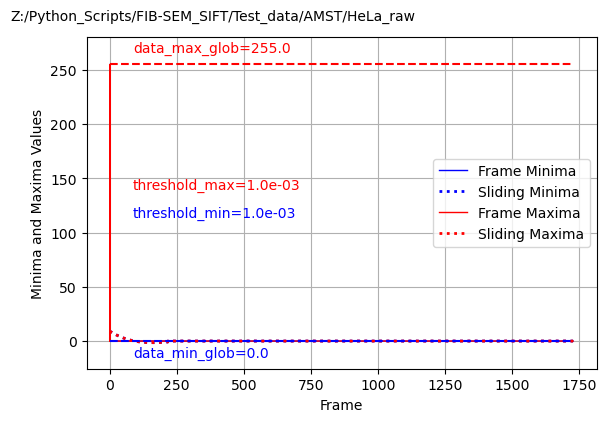

In [8]:
FIBSEM_Data = test_dataset.evaluate_FIBSEM_statistics(DASK_client = client)
generate_report_data_minmax_xlsx(FIBSEM_Data[0])

# Steps 3 and 4: Extract Key Points and Descriptors, Find Matches and Transformations

Step 3: Extract Key Points and Descriptors
DASK client exists. Will perform distributed computations
Use http://localhost:53438/status to monitor DASK progress
2024/06/21  22:54:15   Using DASK distributed
Step 3: Elapsed time: 2033.72 seconds

Step 4: Select Good Matches with FLANN matcher
Step 4: using RegularizedAffineTransform Transformation Model with RANSAC solver
Step 4: RegularizedAffineTransform parameters:
Step 4: Regularization matrix: 
[[1.e-05 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 1.e-05 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 1.e-05 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 1.e-05 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]]
Step 4: Target Solution:  [1 0 0 0 1 0]
DASK client exists. Will perform distributed computations
Use http://localhost:53438/status to monitor DASK progress
2024/06/21  23:28:08   Using DASK distributed
Mean Number of Keypoints : 689
Step 4: Elapsed time: 2058.19 seconds


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

CPU times: total: 12min 17s
Wall time: 1h 8min 39s


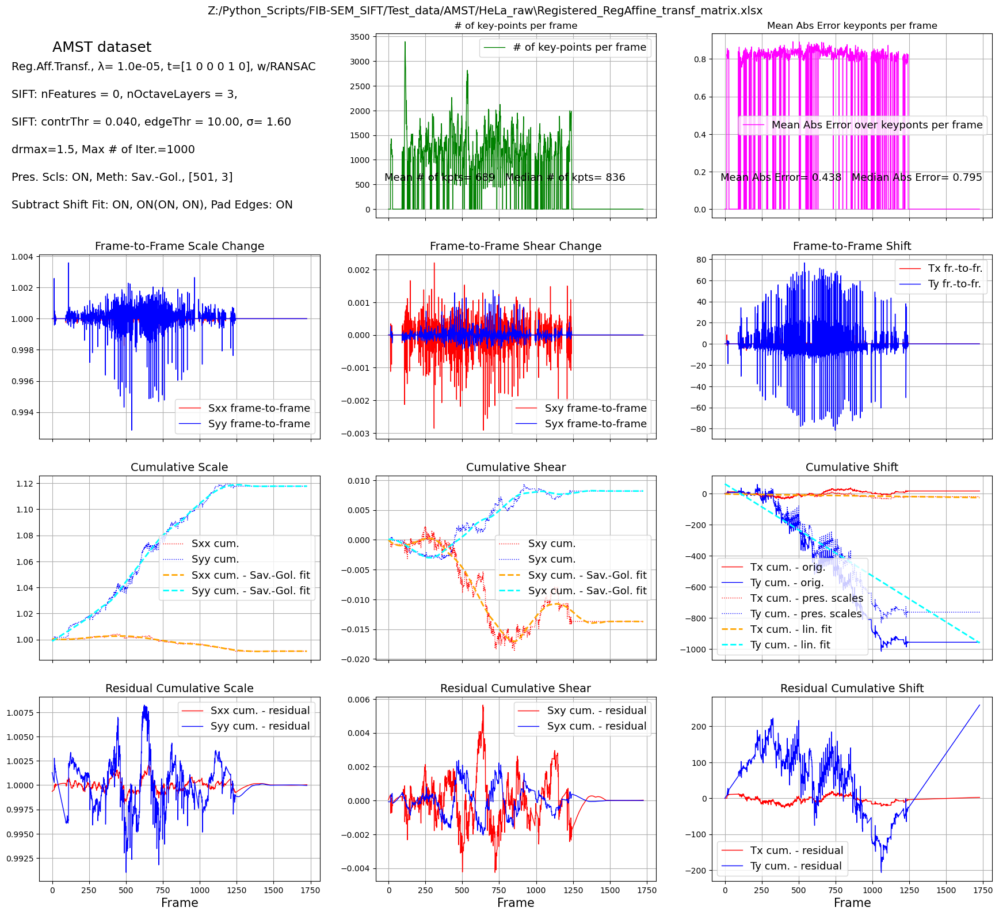

In [9]:
%%time

# Step 3: Extract Key Points and Descriptors using DASK Distributed
t1 = time.time()
print('Step 3: Extract Key Points and Descriptors')
fnms = test_dataset.extract_keypoints(DASK_client = client)   
t2 = time.time()
print('Step 3: Elapsed time: {:.2f} seconds'.format(t2 - t1))
print('')

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client = client)
t3 = time.time()
print('Step 4: Elapsed time: {:.2f} seconds'.format(t3 - t2))

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

DASK client exists. Will perform distributed computations
Use http://localhost:53438/status to monitor DASK progress
2024/06/22  06:42:12   Using DASK distributed
Mean Number of Keypoints : 820


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

CPU times: total: 11min 37s
Wall time: 49min 20s


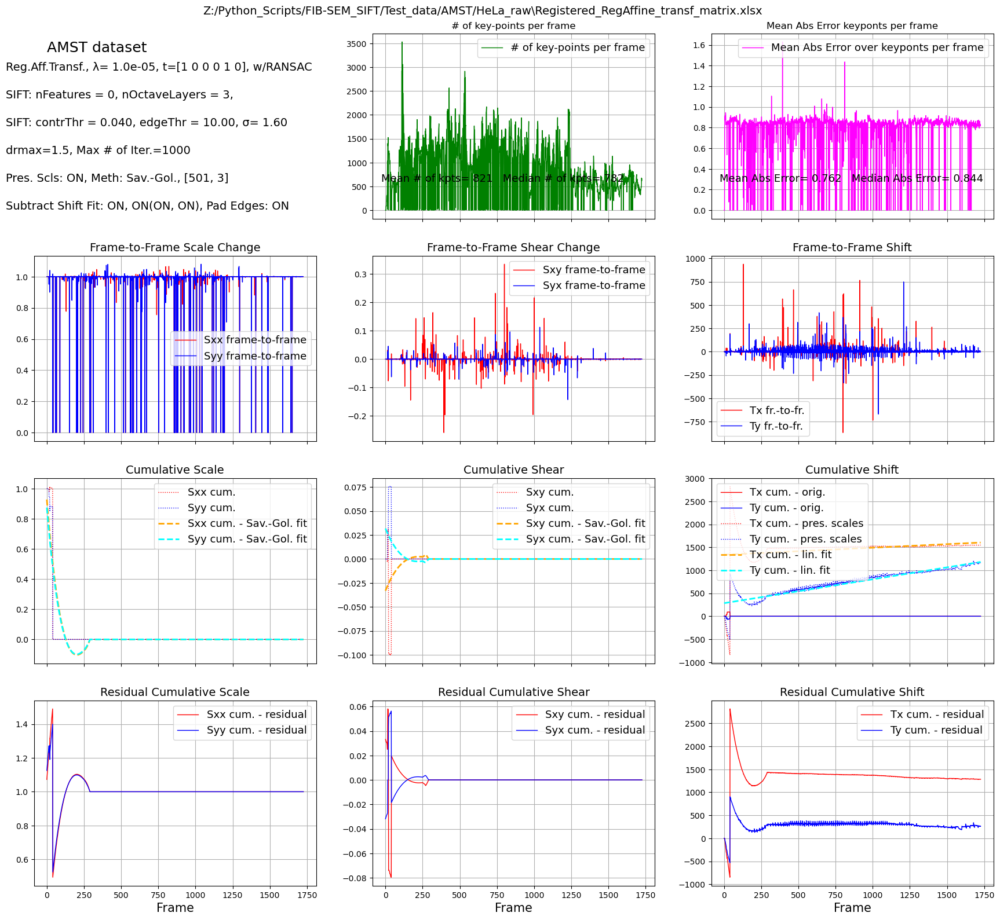

In [21]:
%%time
results_s4 = test_dataset.determine_transformations(DASK_client = client, RANSAC_initial_fraction =0.005)

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

DASK client exists. Will perform distributed computations
Use http://localhost:53438/status to monitor DASK progress
2024/06/22  09:23:16   Using DASK distributed
Mean Number of Keypoints : 1164


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

CPU times: total: 5min 13s
Wall time: 22min 5s


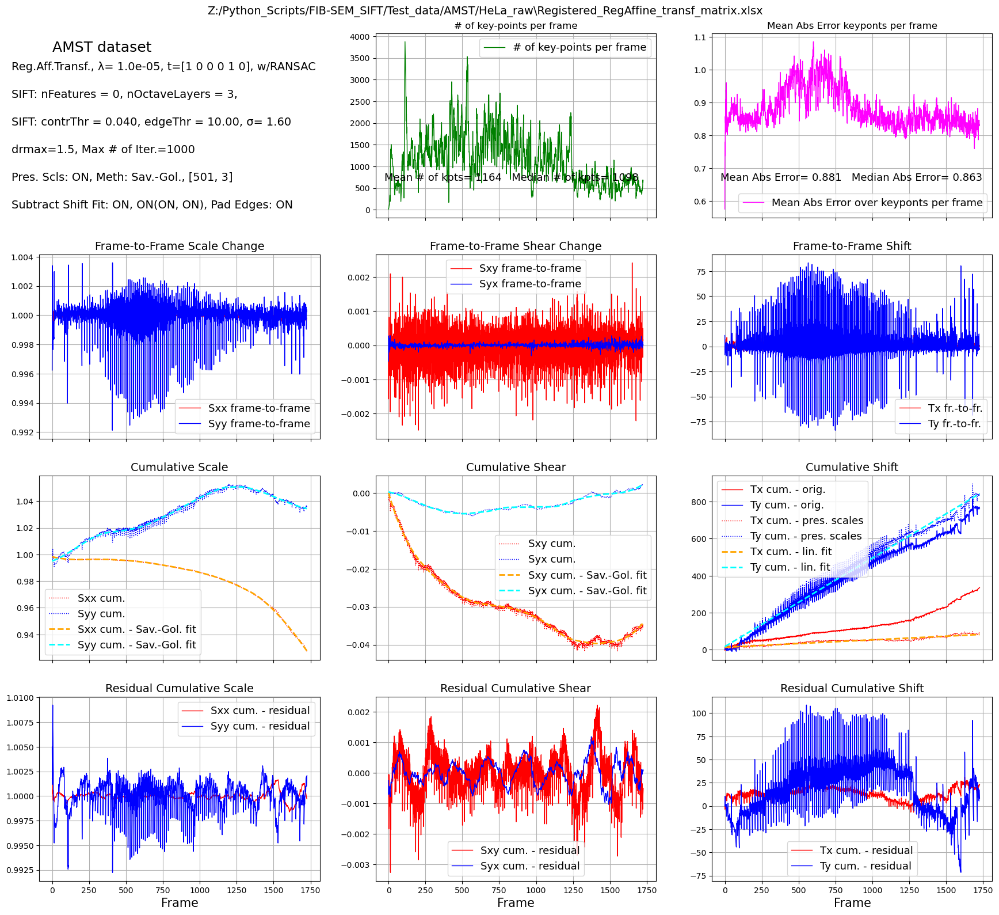

In [22]:
%%time
results_s4 = test_dataset.determine_transformations(DASK_client = client, solver='LinReg')

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

Step 3: Extract Key Points and Descriptors
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
2024/05/30  11:40:37   Using DASK distributed
Step 3: Elapsed time: 2208.67 seconds

Step 4: Select Good Matches with FLANN matcher
Step 4: using RegularizedAffineTransform Transformation Model with RANSAC solver
Step 4: RegularizedAffineTransform parameters:
Step 4: Regularization matrix: 
[[1.e-05 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 1.e-05 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 1.e-05 0.e+00 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 1.e-05 0.e+00]
 [0.e+00 0.e+00 0.e+00 0.e+00 0.e+00 0.e+00]]
Step 4: Target Solution:  [1 0 0 0 1 0]
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
2024/05/30  12:17:26   Using DASK distributed
Mean Number of Keypoints : 1042
Step 4: Elapsed time: 5368.10 seconds


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

Wall time: 2h 6min 54s


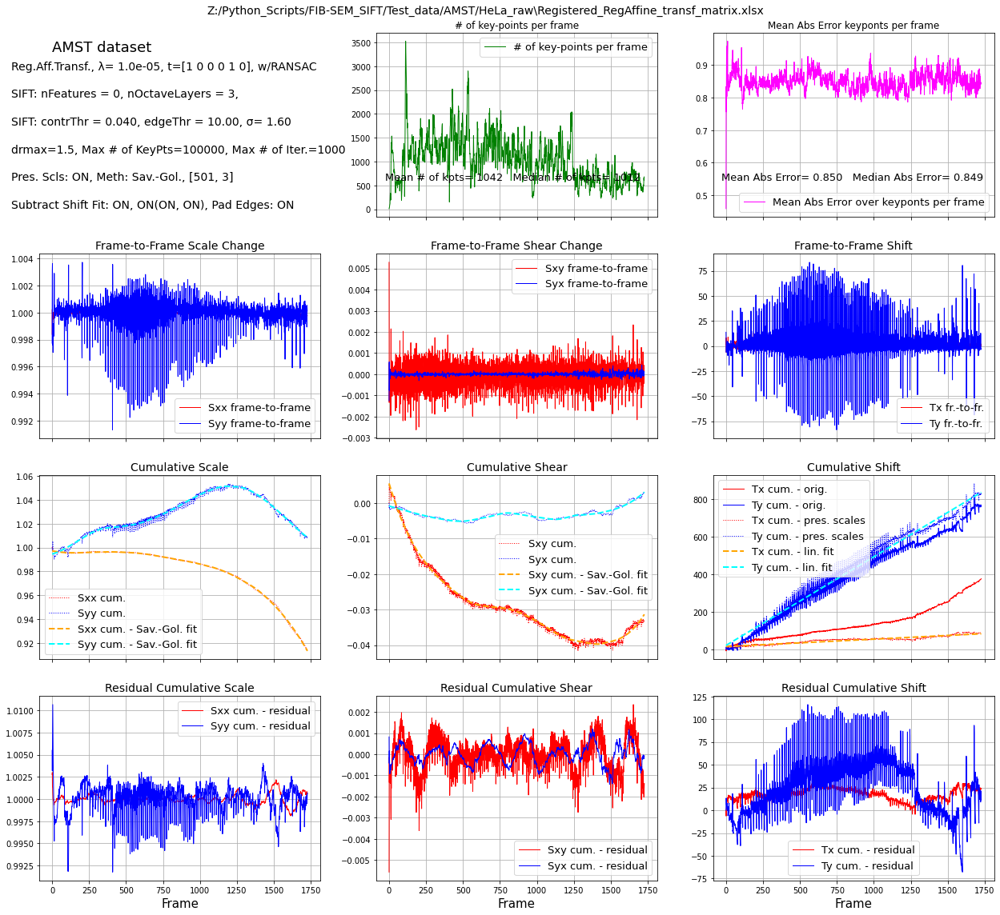

In [16]:
%%time

# Step 3: Extract Key Points and Descriptors using DASK Distributed
t1 = time.time()
print('Step 3: Extract Key Points and Descriptors')
fnms = test_dataset.extract_keypoints(DASK_client = client)   
t2 = time.time()
print('Step 3: Elapsed time: {:.2f} seconds'.format(t2 - t1))
print('')

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client = client)
t3 = time.time()
print('Step 4: Elapsed time: {:.2f} seconds'.format(t3 - t2))

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

In [17]:
# here is an example of how the previous step can be modified easily without having to re-do all previous steps
# this will calculate the cumulative transformation matrix WITHOT modifying the object property subtract_linear_fit
# so this change will NOT propagate.
# tr_matr_cum_residual = test_dataset.process_transformation_matrix(subtract_linear_fit = [False, True])
# if you want to make permanet change, then you should do this:
# test_dataset.subtract_linear_fit = [False, True]
# tr_matr_cum_residual = test_dataset.process_transformation_matrix()


# Step 5: Search for frames with no (or low # of) matches and possibly remove them.

In [18]:
thr_npt = 3   # consider frame with less than 3 Key Points for removal
tr_matr_cum_residual = test_dataset.check_for_nomatch_frames(thr_npt, **SIFT_kwargs)

Frames with no matches to the next frame:   []
Frames to remove:   []
No frames selected for removal


# Step 6: Recall or Save the Intermediate Data (KeyPoints, Matches, Transf.Matrix, etc.) from / into spreadsheets and a binary files.  Remove the intermediate KeyPoint/Descriptor files.

In [19]:
recall_the_data = False          # if False, the data will be saved. if True, the data will be recalled

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))

if recall_the_data:
    print('Parameters recalled from the file: ', dump_filename)
    test_dataset = FIBSEM_dataset(fls, recall_parameters=True, dump_filename=dump_filename, **SIFT_kwargs)
    
else:
    saved_dump_filename = test_dataset.save_parameters(dump_filename=dump_filename)
    print('Parameters saved into the file: ', saved_dump_filename)

Parameters saved into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_RegAffine_params.bin


In [20]:
remove_key_points_data = False   # if True, the binary files with intermediate keypoints data for each frame will be removed

# Remove temporary files
if remove_key_points_data:
    # Remove the keypoint/ descriptor files
    for fnm in tqdm(test_dataset.fnms, desc='Removing KeyPoint/Descriptor Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass
    for fnm in tqdm(test_dataset.fnms_matches, desc='Removing Matched KeyPoint Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass


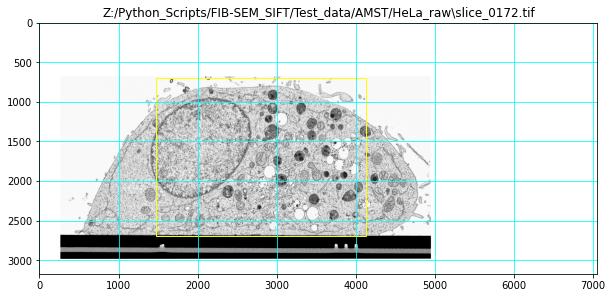

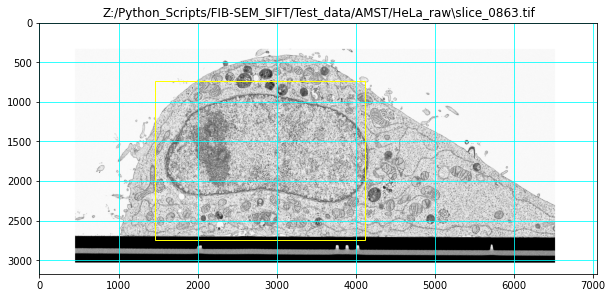

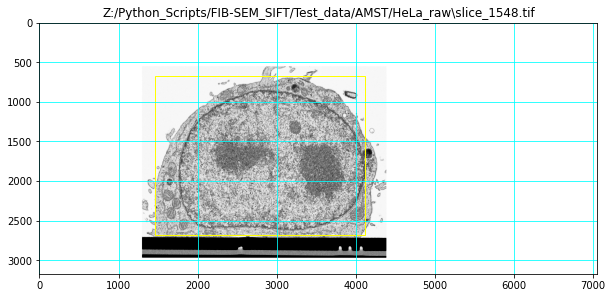

In [21]:
# evaluation_box = [250, 2000, 1450, 2650]      # optional evaluation box for defining the area over which the registration quality
# test_dataset.show_eval_box(evaluation_box = evaluation_box, invert_data=False)
#
# default frames are three frames: 10% from the start, 50% from the start, and 90% from the start
# alternatively you can set any list of frame indecis by using keyword frame_indices
# for example:0
# test_dataset.show_eval_box(frame_indices=[1, 100, 850], evaluation_box = evaluation_box, invert_data=False)
#

evaluation_box = [375, 2000, 1450, 2650]
test_dataset.show_eval_box(evaluation_box = evaluation_box,
                           invert_data=False, flipY=True)

# Step 7: Transform and Save the FIB-SEM data

Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/30  13:48:00   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/30  13:54:15   Finished DASK jobs
Analyzing Registration Quality
2024/05/30  13:54:16   Analyzing Frame Registration: Starting DASK jobs
2024/05/30  14:07:45   Finished DASK jobs
2024/05/30  14:07:57   Saving the Registration Quality Statistics into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_RegAffine_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=7054, ny=3173, nz=1727,  data type: <class 'numpy.int16'>
Voxel Size (nm): 8.000000 x 8.000000 x 8.000000
2024/05/30  14:07:58   Saving dataset into MRC file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_RegAffine.mrc


Saving Frames into MRC File:   0%|          | 0/1727 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/1727 [00:00<?, ?it/s]

Wall time: 42min 30s


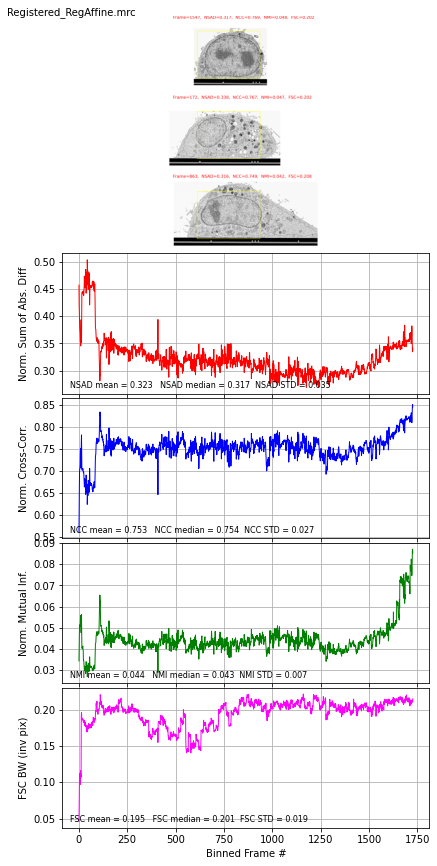

In [22]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

evaluation_box = [375, 2000, 1430, 2650]
reg_summary_regaffine, reg_summary_regaffine_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        flipY=True,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        evaluation_box = evaluation_box,
                                                        fnm_types = ['mrc']) # following additional keys are available:
                                                #
                                                # perform_transformation (default=True). Set to false if you want to save the raw data into a single stack
                                                # and evaluare raw registration quality
                                                #
                                                # invert_data (default=False). Set to True if you want to invert te data
                                                #
                                                # evaluation_box (default [0, -1, 0, -1]. Set boundaries ([top, height, left, width]))
                                                # of the image subset to be used for registration quality evaluation

generate_report_from_xls_registration_summary(reg_summary_regaffine_xlsx)

Step 4: Select Good Matches with FLANN matcher
Step 4: using AffineTransform Transformation Model with RANSAC solver
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
2024/05/30  14:30:30   Using DASK distributed
Mean Number of Keypoints : 1041


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

Parameters saved into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_Affine_params.bin
Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/30  16:28:01   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/30  16:34:17   Finished DASK jobs
Analyzing Registration Quality
2024/05/30  16:34:17   Analyzing Frame Registration: Starting DASK jobs
2024/05/30  16:47:59   Finished DASK jobs
2024/05/30  16:48:09   Saving the Registration Quality Statistics into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_Affine_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=7063, ny=3171, nz=1727,  data type: <class 'numpy.int16'>
Voxel Size (nm): 8.000000 x 8.000000 x 8.000000
2024/05/30  16:48:10   Saving dataset into MRC file

Saving Frames into MRC File:   0%|          | 0/1727 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/1727 [00:00<?, ?it/s]

Wall time: 2h 39min 39s


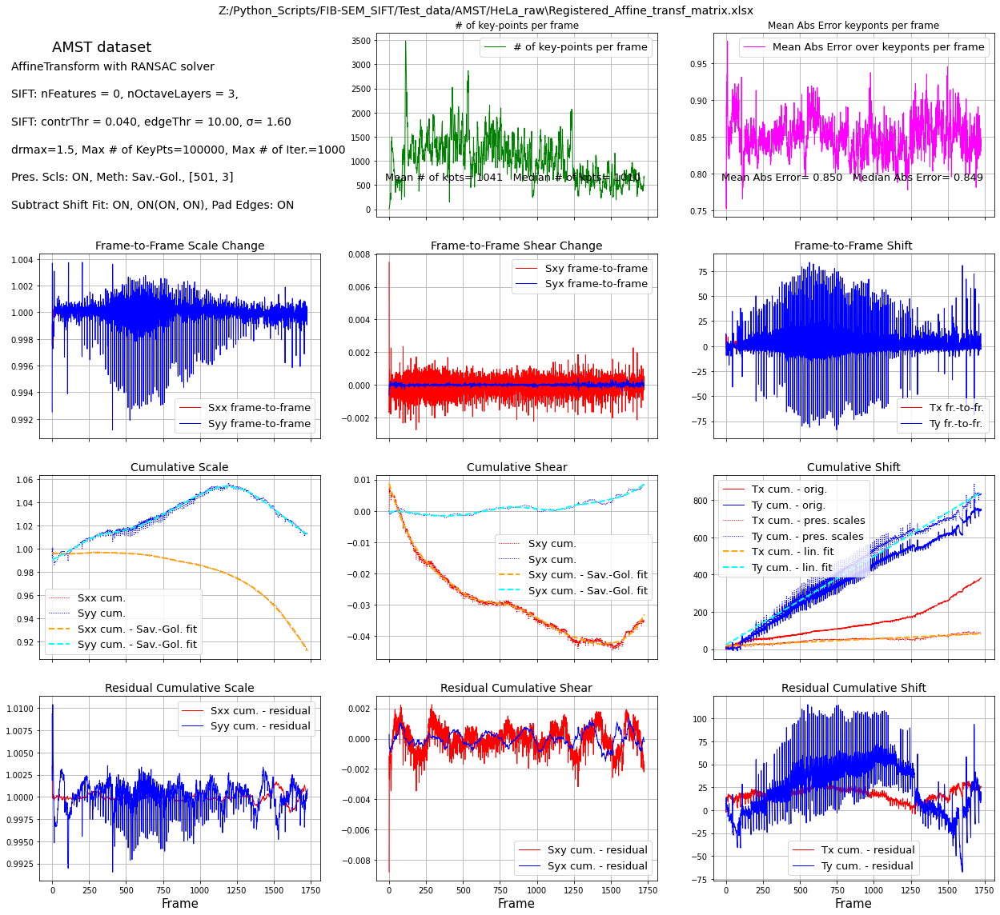

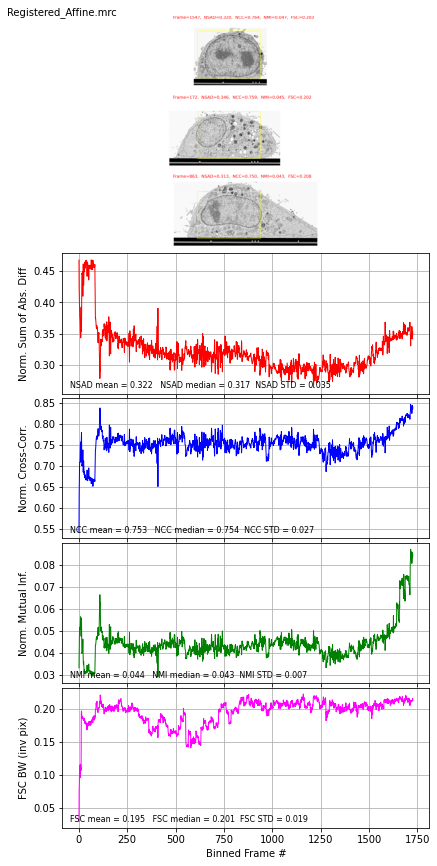

In [23]:
%%time
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
#TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
test_dataset.TransformType = AffineTransform
SIFT_kwargs['TransformType'] = test_dataset.TransformType
test_dataset.fnm_reg = 'Registered_Affine.mrc'

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client = client)

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))
saved_dump_file = test_dataset.save_parameters(dump_file=dump_filename)
print('Parameters saved into the file: ', saved_dump_file)

print('Step 7: Transform and Save the FIB-SEM data')

evaluation_box = [375, 2000, 1450, 2650]       # optional evaluation box for defining the area over which the registration quality
                                                # is evaluated. It can be checked in the step above. The use 
                                                # of the method below would be:

reg_summary_affine, reg_summary_affine_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                                              flipY=True,
                                                                              save_transformed_dataset = True,
                                                                              save_registration_summary = True,
                                                                              evaluation_box = evaluation_box,
                                                                              fnm_types = ['mrc'])
generate_report_from_xls_registration_summary(reg_summary_affine_xlsx)

Step 4: Select Good Matches with FLANN matcher
Step 4: using ScaleShiftTransform Transformation Model with RANSAC solver
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
2024/05/30  17:10:14   Using DASK distributed
Mean Number of Keypoints : 1012


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

Parameters saved into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_ScaleShift_params.bin
Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/30  18:07:05   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/30  18:13:04   Finished DASK jobs
Analyzing Registration Quality
2024/05/30  18:13:05   Analyzing Frame Registration: Starting DASK jobs
2024/05/30  18:25:48   Finished DASK jobs
2024/05/30  18:26:00   Saving the Registration Quality Statistics into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_ScaleShift_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=7040, ny=3167, nz=1727,  data type: <class 'numpy.int16'>
Voxel Size (nm): 8.000000 x 8.000000 x 8.000000
2024/05/30  18:26:02   Saving dataset into 

Saving Frames into MRC File:   0%|          | 0/1727 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/1727 [00:00<?, ?it/s]

Wall time: 1h 38min 52s


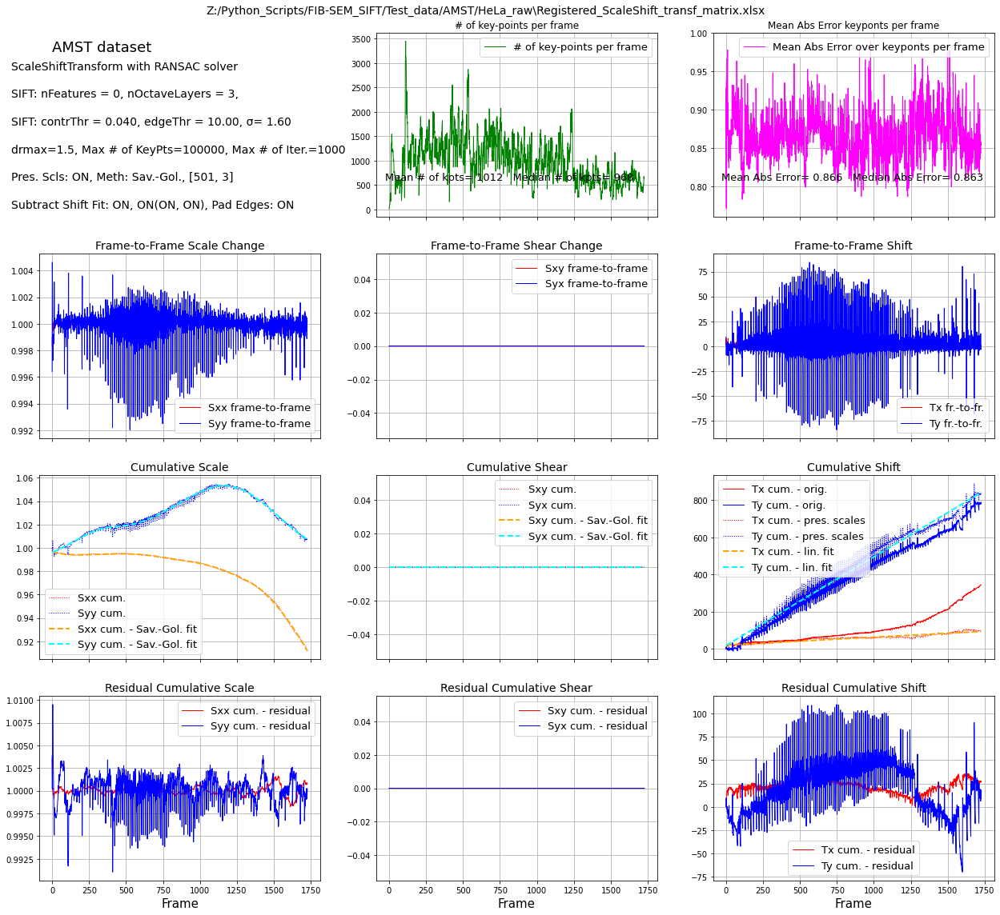

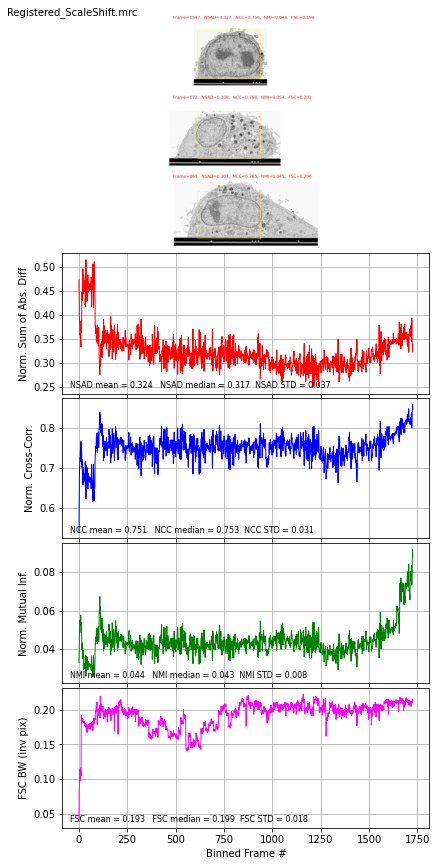

In [24]:
%%time
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
#TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
test_dataset.TransformType = ScaleShiftTransform
SIFT_kwargs['TransformType'] = test_dataset.TransformType
test_dataset.fnm_reg = 'Registered_ScaleShift.mrc'

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client = client)

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))
saved_dump_file = test_dataset.save_parameters(dump_file=dump_filename)
print('Parameters saved into the file: ', saved_dump_file)

print('Step 7: Transform and Save the FIB-SEM data')

evaluation_box = [375, 2000, 1450, 2650]       # optional evaluation box for defining the area over which the registration quality
                                                # is evaluated. It can be checked in the step above. The use 
                                                # of the method below would be:

reg_summary_scaleshift, reg_summary_scaleshift_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                                                      flipY=True,
                                                                                    save_transformed_dataset = True,
                                                                                    save_registration_summary = True,
                                                                                    evaluation_box = evaluation_box,
                                                                                      fnm_types = ['mrc'])
generate_report_from_xls_registration_summary(reg_summary_scaleshift_xlsx)

Step 4: Select Good Matches with FLANN matcher
Step 4: using ShiftTransform Transformation Model with RANSAC solver
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
2024/05/30  18:49:10   Using DASK distributed
Mean Number of Keypoints : 941


Calculating Cummilative Transformation Matrix:   0%|          | 0/1726 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/1726 [00:00<?, ?it/s]

Parameters saved into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_Shift_params.bin
Step 7: Transform and Save the FIB-SEM data
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/30  19:39:19   Transform and Save Chunks of Frames: Starting DASK jobs
2024/05/30  19:45:22   Finished DASK jobs
Analyzing Registration Quality
2024/05/30  19:45:23   Analyzing Frame Registration: Starting DASK jobs
2024/05/30  19:58:45   Finished DASK jobs
2024/05/30  19:58:57   Saving the Registration Quality Statistics into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\Registered_Shift_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=7036, ny=3187, nz=1727,  data type: <class 'numpy.int16'>
Voxel Size (nm): 8.000000 x 8.000000 x 8.000000
2024/05/30  19:58:58   Saving dataset into MRC file: 

Saving Frames into MRC File:   0%|          | 0/1727 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/1727 [00:00<?, ?it/s]

Wall time: 1h 32min 42s


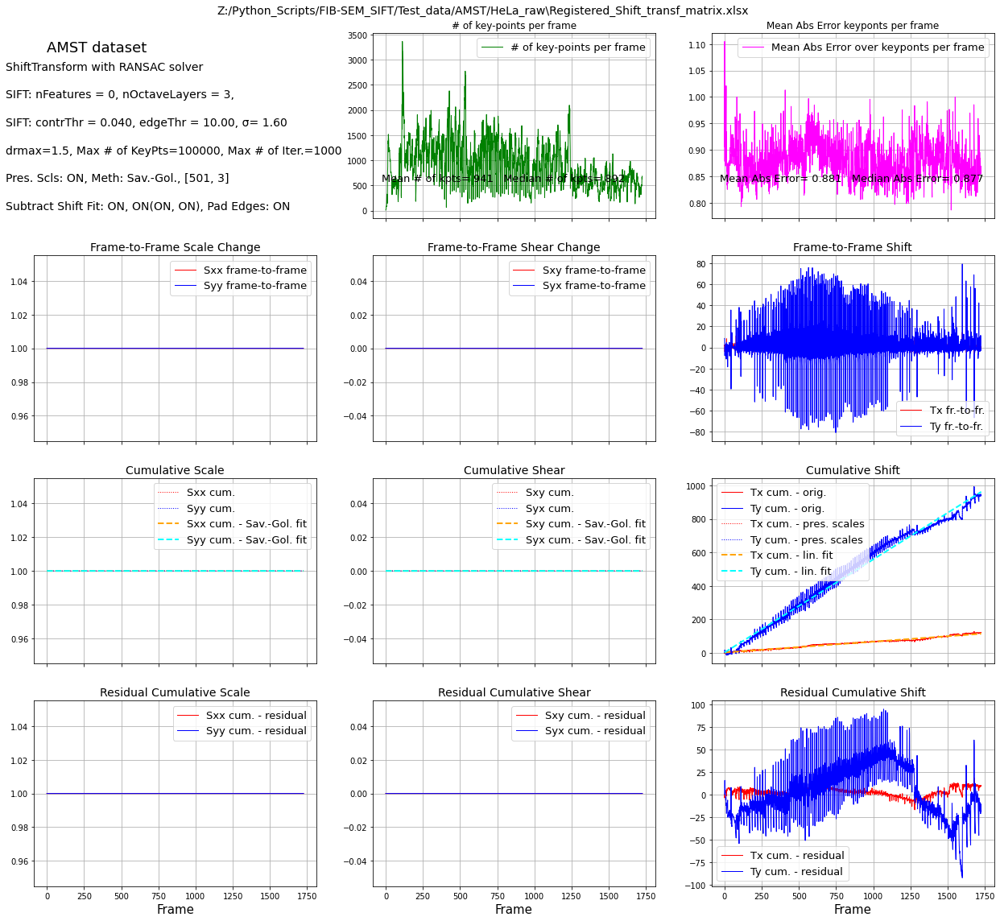

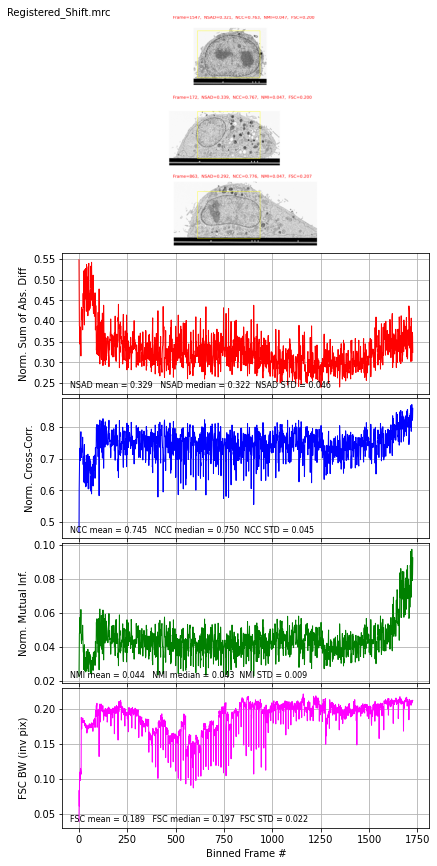

In [25]:
%%time
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
#TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
test_dataset.TransformType = ShiftTransform
SIFT_kwargs['TransformType'] = test_dataset.TransformType
test_dataset.fnm_reg = 'Registered_Shift.mrc'

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if test_dataset.TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(DASK_client = client)

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))
saved_dump_file = test_dataset.save_parameters(dump_file=dump_filename)
print('Parameters saved into the file: ', saved_dump_file)

print('Step 7: Transform and Save the FIB-SEM data')

evaluation_box = [375, 2000, 1450, 2650]       # optional evaluation box for defining the area over which the registration quality
                                                # is evaluated. It can be checked in the step above. The use 
                                                # of the method below would be:

reg_summary_shift, reg_summary_shift_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                                            flipY=True,
                                                                            save_transformed_dataset = True,
                                                                            save_registration_summary = True,
                                                                            evaluation_box = evaluation_box,
                                                                            fnm_types = ['mrc'])
generate_report_from_xls_registration_summary(reg_summary_shift_xlsx)

2024/05/30  20:21:56   Registered data will be saved into:  Registered_I16_ShiftTransform_RANSAC_drmax1.5_const_scls_SG_shift_subtr_padded_l2_1e-05.mrc
Total Number of frames:  1727
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Evaluating the parameters of FIBSEM data set (data Min/Max, Working Distance, Milling Y Voltage, FOV center positions, Scan Rate, EHT)
Original data is 8-bit, no need to find Min and Max for 8-bit conversion
2024/05/30  20:21:56   Saving the FIBSEM dataset statistics (Min/Max, Mill Rate, FOV Shifts into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw\FIBSEM_Data.xlsx
No milling rate data is available, isotropic voxel size is set to 8.00 nm
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/30  20:22:00   Transform and Save Chunks of Frames: Startin

Removing Intermediate Registered Frame Files:   0%|          | 0/1727 [00:00<?, ?it/s]

Wall time: 16min 59s


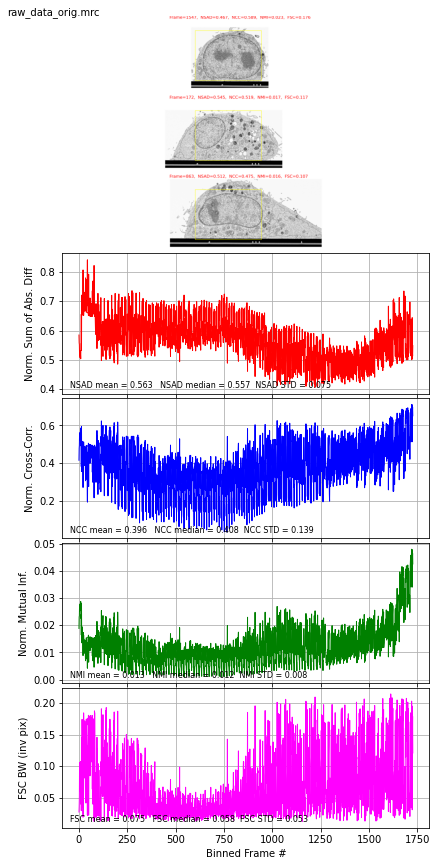

In [26]:
%%time
data_dir_raw = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw'
fls_raw = sorted(glob.glob(os.path.join(data_dir_raw,'*.tif')))
test_dataset = FIBSEM_dataset(fls_raw, **SIFT_kwargs)
test_dataset.data_dir = data_dir_raw
test_dataset.fnm_reg = 'raw_data_orig.mrc'
FIBSEM_Data_raw =  test_dataset.evaluate_FIBSEM_statistics(DASK_client = client)

evaluation_box = [375, 2000, 1450, 2650]       # optional evaluation box for defining the area over which the registration quality
                                                # is evaluated. It can be checked in the step above. The use 
                                                # of the method below would be:


raw_reg_summary, raw_reg_summary_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                                        invert_data=False,
                                                                        flipY=True,
                                                                        perform_transformation=False,
                                                                        save_transformed_dataset = False,
                                                                        save_registration_summary = True,
                                                                        evaluation_box = evaluation_box,
                                                                        fnm_types = ['mrc'])
generate_report_from_xls_registration_summary(raw_reg_summary_xlsx)

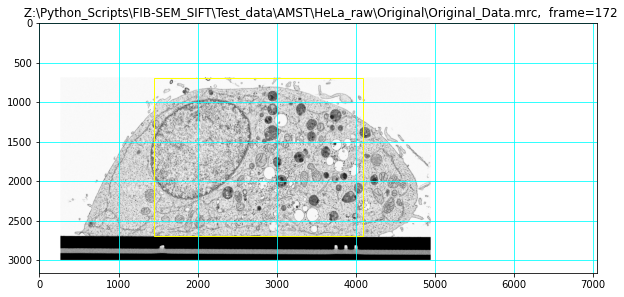

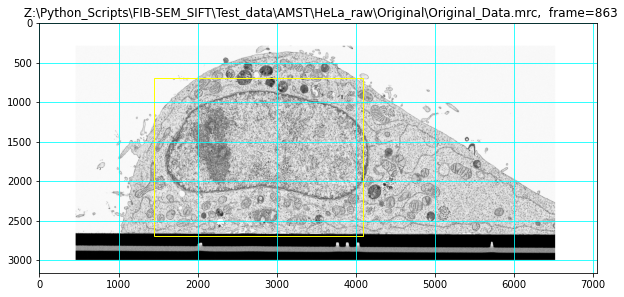

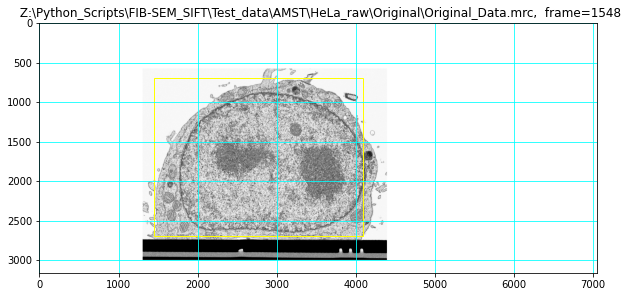

In [27]:
orig_mrc_stack = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw/Original/Original_Data.mrc'
evaluation_box = [700, 2000, 1450, 2650]
show_eval_box_mrc_stack(orig_mrc_stack, evaluation_box = evaluation_box)

DASK client exists. Will perform distributed computations
Use http://localhost:58517/status to monitor DASK progress
2024/05/31  09:30:04   Will use fixed evaluation box:  [700, 2000, 1450, 2650]
mrc_mode=0  , dt_mrc= <class 'numpy.uint8'>
2024/05/31  09:30:04   Will analyze regstrations in 1726 frames
Will save the data into Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw/Original/Original_Data_withEB1_RegistrationQuality.xlsx
2024/05/31  09:30:04   Using DASK distributed
2024/05/31  09:35:02   Saving the Registration Quality Statistics into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw/Original/Original_Data_withEB1_RegistrationQuality.xlsx
Wall time: 5min 1s


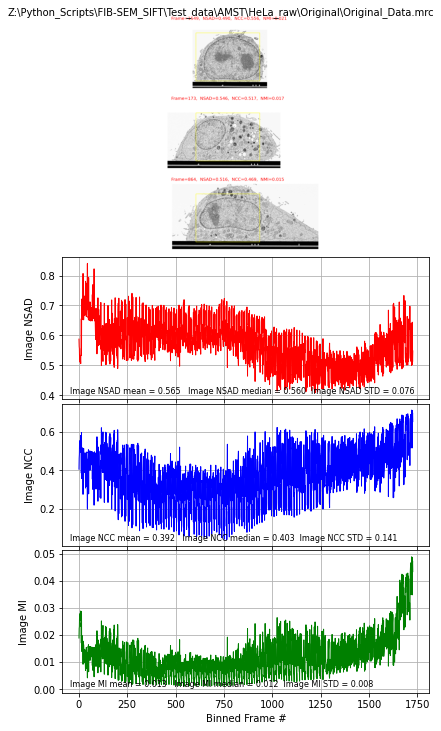

In [3]:
%%time
# alternative way - combine all tif files into a single mrc stack and then evaluate
evaluation_box = [700, 2000, 1450, 2650]
orig_mrc_stack = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw/Original/Original_Data.mrc'
save_filename  = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_raw/Original/Original_Data_withEB1.mrc'
reg_summary_raw1, reg_summary_raw_xlsx1 = analyze_mrc_stack_registration(orig_mrc_stack,
                                                                         DASK_client = client,
                                                                        invert_data=False,
                                                                       evaluation_box = evaluation_box,
                                                                      save_filename=save_filename)
generate_report_from_xls_registration_summary(reg_summary_raw_xlsx1)

In [29]:
data_dir_AMST = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned'
fls_AMST = sorted(glob.glob(os.path.join(data_dir_AMST,'*.tif')))
test_dataset = FIBSEM_dataset(fls_AMST, **SIFT_kwargs)
test_dataset.data_dir = data_dir_AMST
test_dataset.fnm_reg = 'AMST_Data_orig.mrc'

2024/05/30  20:39:17   Registered data will be saved into:  Registered_I16_ShiftTransform_RANSAC_drmax1.5_const_scls_SG_shift_subtr_padded_l2_1e-05.mrc
Total Number of frames:  1727


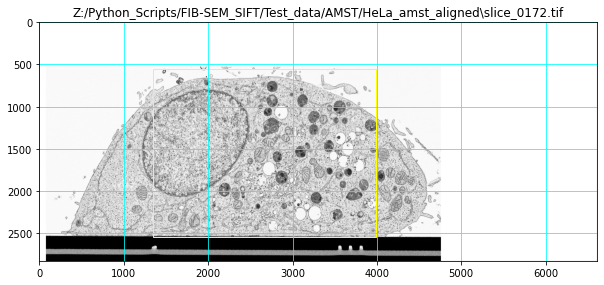

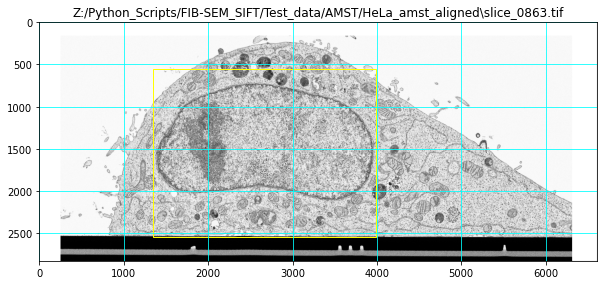

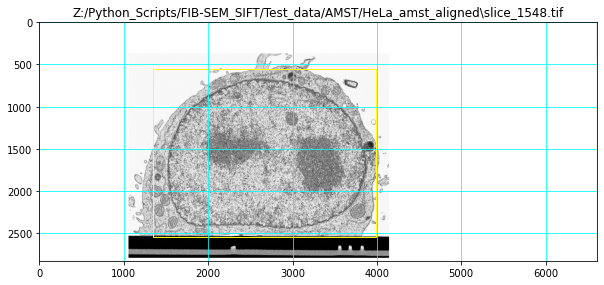

In [30]:
evaluation_box = [280, 2000, 1340, 2650]
test_dataset.show_eval_box(evaluation_box=evaluation_box,
                           perform_transformation=False,
                           flipY=True, invert_data=True)

2024/05/30  20:39:33   Registered data will be saved into:  Registered_I16_ShiftTransform_RANSAC_drmax1.5_const_scls_SG_shift_subtr_padded_l2_1e-05.mrc
Total Number of frames:  1727
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Evaluating the parameters of FIBSEM data set (data Min/Max, Working Distance, Milling Y Voltage, FOV center positions, Scan Rate, EHT)
Original data is 8-bit, no need to find Min and Max for 8-bit conversion
2024/05/30  20:39:33   Saving the FIBSEM dataset statistics (Min/Max, Mill Rate, FOV Shifts into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned\FIBSEM_Data.xlsx
No milling rate data is available, isotropic voxel size is set to 8.00 nm
DASK client exists. Will perform distributed computations
Use http://localhost:51520/status to monitor DASK progress
Transforming and Saving Intermediate Registered Frames
2024/05/30  20:39:37   Transform and Save Chunks of Frames

Removing Intermediate Registered Frame Files:   0%|          | 0/1727 [00:00<?, ?it/s]

Wall time: 17min 22s


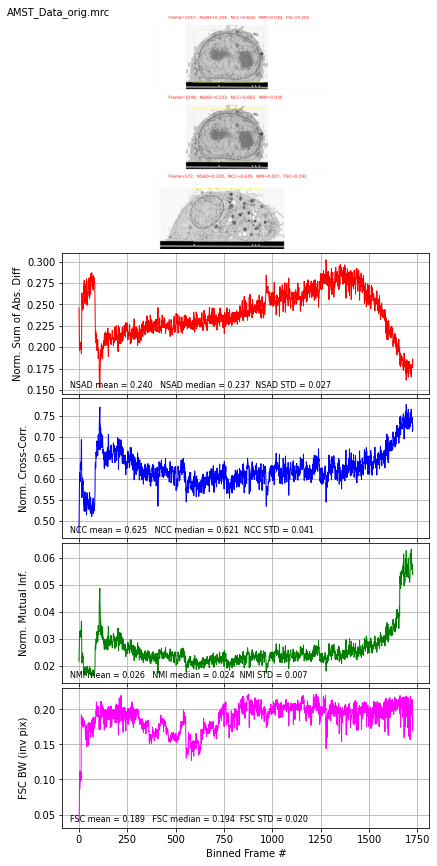

In [31]:
%%time
data_dir_AMST = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned'
fls_AMST = sorted(glob.glob(os.path.join(data_dir_AMST,'*.tif')))
test_dataset = FIBSEM_dataset(fls_AMST, **SIFT_kwargs)
test_dataset.data_dir = data_dir_AMST
test_dataset.fnm_reg = 'AMST_Data_orig.mrc'
FIBSEM_Data_AMST =  test_dataset.evaluate_FIBSEM_statistics(DASK_client = client)

evaluation_box = [280, 2000, 1340, 2650]       # optional evaluation box for defining the area over which the registration quality
                                                # is evaluated. It can be checked in the step above. The use 
                                                # of the method below would be:

AMST_reg_summary, AMST_reg_summary_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                                          invert_data=True,
                                                                          flipY=True,
                                                                          perform_transformation=False,
                                                                          save_transformed_dataset = False,
                                                                          save_registration_summary = True,
                                                                          evaluation_box = evaluation_box)
generate_report_from_xls_registration_summary(AMST_reg_summary_xlsx)

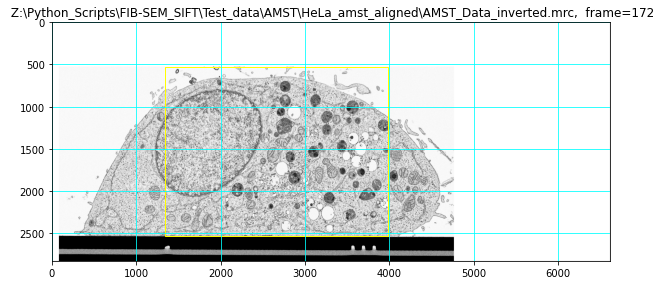

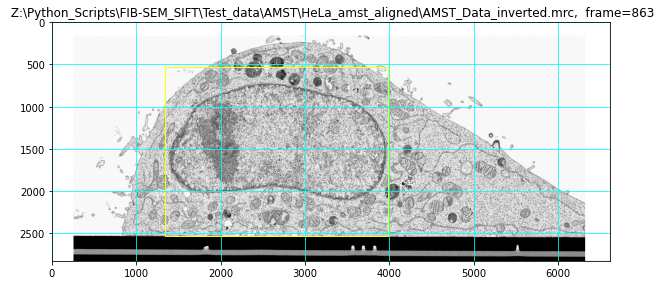

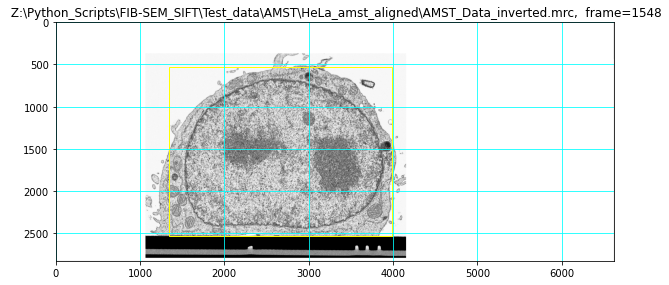

In [32]:
# alternative way - combine all tif files into a single mrc stack and then evaluate
AMST_reg_stack = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned/AMST_Data_inverted.mrc'
evaluation_box = [530, 2000, 1340, 2650]
show_eval_box_mrc_stack(AMST_reg_stack, evaluation_box=evaluation_box)

DASK client exists. Will perform distributed computations
Use http://localhost:58517/status to monitor DASK progress
2024/05/31  09:35:07   Will use fixed evaluation box:  [530, 2000, 1340, 2650]
mrc_mode=0  , dt_mrc= <class 'numpy.uint8'>
2024/05/31  09:35:07   Will analyze regstrations in 1726 frames
Will save the data into Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned/AMST_Data_inverted_withEB1_RegistrationQuality.xlsx
2024/05/31  09:35:07   Using DASK distributed
2024/05/31  09:39:18   Saving the Registration Quality Statistics into the file:  Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned/AMST_Data_inverted_withEB1_RegistrationQuality.xlsx
Wall time: 4min 13s


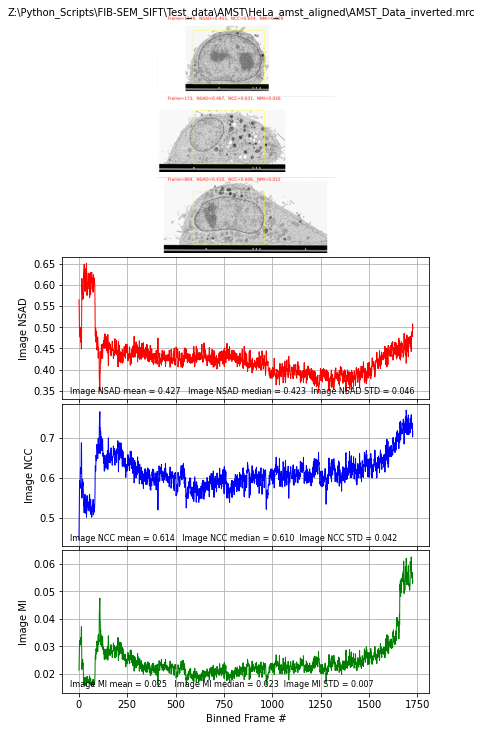

In [4]:
%%time
# alternative way - combine all tif files into a single mrc stack and then evaluate
AMST_reg_stack = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned/AMST_Data_inverted.mrc'
save_filename  = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST/HeLa_amst_aligned/AMST_Data_inverted_withEB1.mrc'
evaluation_box = [530, 2000, 1340, 2650]

AMST_reg_summary1, AMST_reg_summary_xlsx1 = analyze_mrc_stack_registration(AMST_reg_stack,
                                                                           DASK_client = client,
                                                                        invert_data=False,
                                                                       evaluation_box = evaluation_box,
                                                                        save_filename=save_filename)
generate_report_from_xls_registration_summary(AMST_reg_summary_xlsx1)

# Build a Summary 

generating the registration quality summary plots:   0%|          | 0/7 [00:00<?, ?it/s]

saving the data into xlsx file:   0%|          | 0/7 [00:00<?, ?it/s]

'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST\\HeLa_raw\\Regstration_Summary.xlsx'

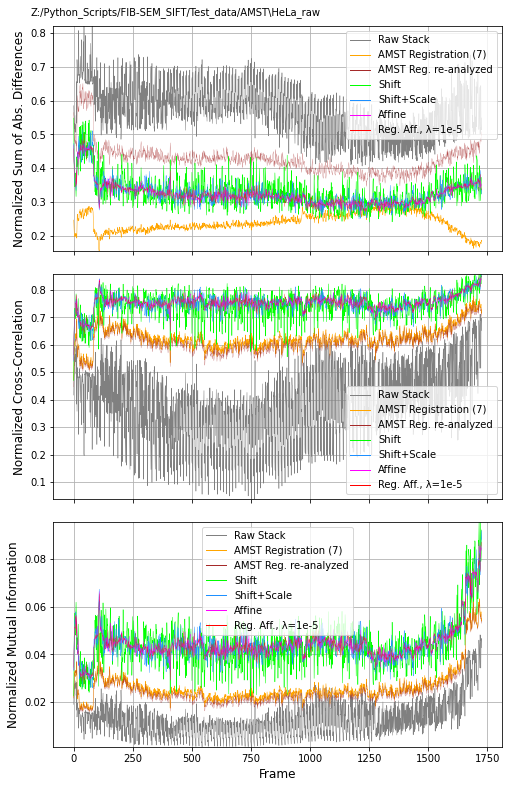

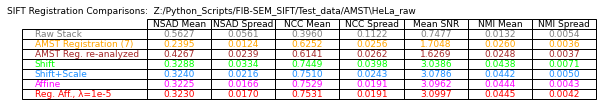

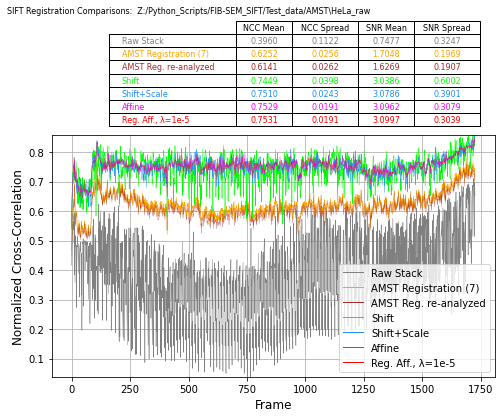

In [5]:
data_dir = 'Z:/Python_Scripts/FIB-SEM_SIFT/Test_data/AMST'

reg_quality_files = ['HeLa_raw/raw_data_orig_RegistrationQuality.xlsx',
                     'HeLa_amst_aligned/AMST_Data_orig_RegistrationQuality.xlsx',
                     'HeLa_amst_aligned/AMST_Data_inverted_withEB1_RegistrationQuality.xlsx',
                     'HeLa_raw/Registered_Shift_RegistrationQuality.xlsx',
                     'HeLa_raw/Registered_ScaleShift_RegistrationQuality.xlsx',
                     'HeLa_raw/Registered_Affine_RegistrationQuality.xlsx',
                     'HeLa_raw/Registered_RegAffine_RegistrationQuality.xlsx']

colors = ['grey', 'orange', 'brown', 'lime', 'dodgerblue', 'magenta', 'red']
linewidths = [0.5, 0.5, 0.2, 0.5, 0.4, 0.3, 0.2]

reg_files = [os.path.join(data_dir, rf) for rf in reg_quality_files]

pfs = ['Raw Stack',
       'AMST Registration (7)',
       'AMST Reg. re-analyzed',
       'Shift',
       'Shift+Scale',
       'Affine',
       'Reg. Aff., λ=1e-5']

plot_registrtion_quality_xlsx(reg_files, pfs, colors=colors, linewidths=linewidths)